In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
#Installing Segmentation models library
!pip install segmentation_models

In [ ]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

In [2]:
# importing required packages...
import os, glob
import cv2, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot as plt
#from patchify import patchify
from PIL import Image
#import segmentation_models as sm
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras.utils import normalize
from tensorflow.keras.models import load_model
from tqdm import tqdm
from random import sample
import pickle
from tensorflow.keras.callbacks import Callback, ModelCheckpoint,  EarlyStopping
from tensorflow.keras.optimizers import SGD, Adam

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [56]:
image = cv2.imread("/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training/ADE_train_00000025.png",1)
#print(image.shape)
#image = cv2.cvtColor(image)

image = cv2.resize(image, (128, 128))
image = Image.fromarray(image)
image = np.array(image)

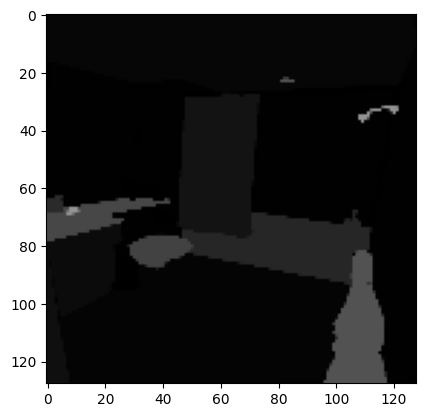

In [57]:
plt.imshow(image)

In [58]:
np.unique(image)

array([  0,   1,   2,   3,   4,   5,   6,   7,   9,  10,  11,  13,  14,
        15,  16,  18,  19,  20,  21,  27,  28,  29,  30,  31,  32,  33,
        34,  35,  36,  37,  38,  41,  42,  43,  50,  51,  55,  56,  58,
        59,  60,  63,  65,  66,  67,  68,  69,  70,  71,  73,  82,  83,
       108, 109, 110, 128, 129, 145, 146, 148], dtype=uint8)

In [59]:
values, counts = np.unique(image, return_counts=True)

In [65]:
values.shape

(60,)

In [70]:
values=list(values)

In [73]:
count = {}

for i in range(len(values)):
    print(values[i] , counts[i])

0 900
1 16197
2 135
3 39
4 10446
5 18
6 9156
7 36
9 39
10 42
11 1623
13 6
14 3
15 585
16 3
18 9
19 3591
20 24
21 6
27 3
28 6
29 12
30 9
31 9
32 6
33 6
34 6
35 6
36 15
37 3
38 2769
41 24
42 81
43 30
50 9
51 3
55 3
56 3
58 6
59 3
60 12
63 6
65 3
66 516
67 6
68 6
69 6
70 6
71 801
73 6
82 1797
83 15
108 3
109 6
110 3
128 3
129 3
145 3
146 60
148 21


In [64]:
counts.shape

(60,)

In [85]:
dfs = pd.read_excel("/kaggle/input/ade20k-colour-labels/ade20k_color_labels.xlsx")

In [91]:

dfs.drop('Unnamed: 1',
  axis='columns', inplace=True)

In [101]:
dfs

,Name,R,G,B,RGB
0,wall,120,120,120,(0 120\n1 180\n2 6\n3 8...
1,building;edifice,180,120,120,(0 120\n1 180\n2 6\n3 8...
2,sky,6,230,230,(0 120\n1 180\n2 6\n3 8...
3,floor;flooring,80,50,50,(0 120\n1 180\n2 6\n3 8...
4,tree,4,200,3,(0 120\n1 180\n2 6\n3 8...
...,...,...,...,...,...
145,shower,0,133,255,(0 120\n1 180\n2 6\n3 8...
146,radiator,255,214,0,(0 120\n1 180\n2 6\n3 8...
147,glass;drinking;glass,25,194,194,(0 120\n1 180\n2 6\n3 8...
148,clock,102,255,0,(0 120\n1 180\n2 6\n3 8...


(512, 683)
(512, 683, 3)


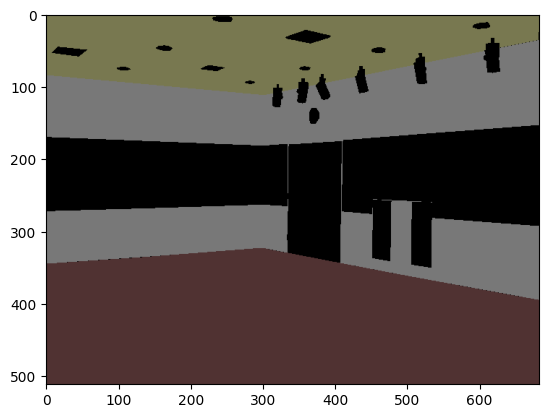

In [75]:
import cv2
import numpy as np

# Define the class label colors (you can customize these as needed)
class_colors = {
    1: (120, 120, 120),    #wall
    2: (180, 120, 120),   #building
    3: (6, 230, 230),     #sky
    4: (80,50,50),        #floor
    5: (4, 200, 3),       #tree
    6: (120,120,80),      #Ceiling
    7: (140, 140, 140),   #route
    12: (235, 255, 7),    #sidewalk/pavement
    13: (150, 5, 61),     #Person
    49: (140, 140, 140),  #Skyscrapper
    121: (255,204,0),     #food
    127: (255, 0, 122),   #Animal  
    
   
}

# Load the image and corresponding segmentation mask
image = cv2.imread('/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training/ADE_train_00000003.jpg')  # Replace 'input_image.jpg' with your image path
mask = cv2.imread('/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training/ADE_train_00000003.png', cv2.IMREAD_GRAYSCALE)  # Replace 'segmentation_mask.png' with your mask path

# Initialize an output image with the same dimensions as the input image
output = np.zeros_like(image)
print(mask.shape)

# Apply colors to the mask based on class labels
labels = list(class_colors.values())
for class_label, color in class_colors.items():
    output[mask == class_label] = color
    


print(output.shape)
plt.imshow(output)


[  0   1   4   6  15  83 149]
0
1
4
6
15
83
149
[0 1 4 6]
(512, 683)


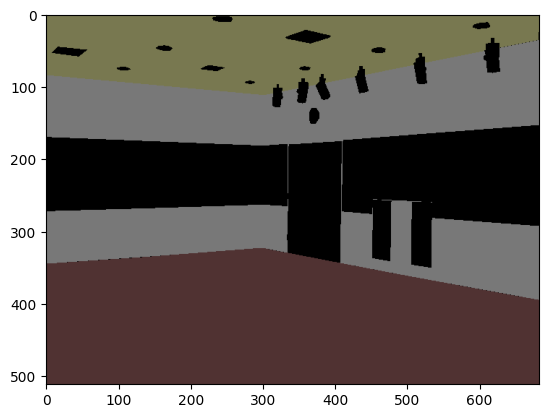

In [3]:
import cv2
import numpy as np

# Define the class label colors
class_colors = {
    1: (120, 120, 120),    # Wall
    2: (180, 120, 120),    # Building
    3: (6, 230, 230),      # Sky
    4: (80, 50, 50),       # Floor
    5: (4, 200, 3),        # Tree
    6: (120, 120, 80),     # Ceiling
    7: (140, 140, 140),    # Route
    12: (235, 255, 7),     # Sidewalk/Pavement
    13: (150, 5, 61),      # Person
    49: (140, 140, 140),   # Skyscraper
    121: (255, 204, 0),    # Food
    127: (255, 0, 122),    # Animal           # Background
    0: (0, 0, 0) 
}
class_colors_keys = [1,2,3,4,5,6,7,12,13,49,121,127]

# Load the segmentation mask
mask = cv2.imread('/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training/ADE_train_00000003.png', cv2.IMREAD_GRAYSCALE)  # Replace 'segmentation_mask.png' with your mask path
print( np.unique(mask))

# Apply class label changes
for label in np.unique(mask):
    print(label)
    if label not in class_colors_keys:
        mask[mask == label] = 0
        
print( np.unique(mask))

image = cv2.imread('/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training/ADE_train_00000003.jpg') 
output = np.zeros_like(image)
print(mask.shape)
# Apply colors to the mask based on class labels
labels = list(class_colors.values())
for class_label, color in class_colors.items():
    output[mask == class_label] = color


plt.imshow(output)


In [173]:
class_colors = {
    1: (120, 120, 120),    # Wall
    2: (180, 120, 120),    # Building
    3: (6, 230, 230),      # Sky
    4: (80, 50, 50),       # Floor
    5: (4, 200, 3),        # Tree
    6: (120, 120, 80),     # Ceiling
    7: (140, 140, 140),    # Route
    12: (235, 255, 7),     # Sidewalk/Pavement
    13: (150, 5, 61),      # Person
    49: (140, 140, 140),   # Skyscraper
    121: (255, 204, 0),    # Food
    127: (255, 0, 122),    # Animal           # Background
    0: (0, 0, 0) 
}
class_colors_keys = [1,2,3,4,5,6,7,12,13,49,121,127]

train_path = r"/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training"
anno_path = r"/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training"

image_dataset,mask_dataset,masked_image_dataset = [],[],[]

def load_images_bw_mask(image_path):
    image = cv2.imread(image_path,0)
    #print(image.shape)
    #image = cv2.cvtColor(image)
    image = cv2.resize(image, (128, 128))
    image = Image.fromarray(image)
    image = np.array(image)
    return image


def load_images_bw(image_path):
    image = cv2.imread(image_path,1)
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))
    image = Image.fromarray(image)
    image = np.array(image)
    return image


#Read first 50 images 
for i in range(100,999):
    # Load the segmentation mask
    image_name = 'ADE_train_00000'+str(i)+'.png'
    mask = load_images_bw_mask(os.path.join(anno_path,image_name))
    #mask = cv2.imread(os.path.join(anno_path,image_name), cv2.IMREAD_GRAYSCALE)  # Replace 'segmentation_mask.png' with your mask path 
    print("before: ",np.unique(mask))
    
    
    label_encoding = {}
    # Apply class label changes
    for label in np.unique(mask):
        if label not in class_colors_keys:
            mask[mask == label] = 0
    '''        
    # Perform label encoding
    unique_labels = np.unique(mask)
    encoded_mask = np.zeros_like(mask)
    for idx, label in enumerate(unique_labels):
        label_encoding[label] = idx  # Assign numerical value to each unique label
        encoded_mask[mask == label] = idx  # Update the encoded mask

    # Display label encoding dictionary
    print("Label Encoding Dictionary:")
    print(label_encoding)
    
    plt.imshow(encoded_mask)
    '''
    print("After : ",np.unique(mask))
    train_image_name = 'ADE_train_00000'+str(i)+'.jpg'
    image = load_images_bw(os.path.join(train_path,train_image_name)) 
    output = np.zeros_like(image)
    # Apply colors to the mask based on class labels
    labels = list(class_colors.values())
    for class_label, color in class_colors.items():
        output[mask == class_label] = color
    
    #Savingimages 
    #print("Saving : ", image_name, train_image_name)
    
    image_dataset.append(image[:,:,0])
    mask_dataset.append(mask)
    masked_image_dataset.append(output)
    


before:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 30 31 32 33 34 35 37 38 39 40 41 42 43 44 45 46 47 48 49
 50 52 53 54 55 57 59 60 62 63 64 66 67 68 69 70 71 76 83]
After :  [ 0  1  2  3  4  5  6  7 12 13 49]
before:  [  0   1   2   3   4   5   6   7   8  10  11  12  15  19  20  21  23  25
  27  28  29  30  34  35  38  45  47  48  53  54  57  59  65  69  74  77
  78  80  83 146]
After :  [ 0  1  2  3  4  5  6  7 12]
before:  [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  51  52  53  54  57  58
  59  60  61  62  63  64  66  67  69  70  71  84  88  90  92  96  98 106
 110 112 113 131 148]
After :  [ 0  1  2  3  4  5  6  7 12 13]
before:  [  0   1   2   3   6   7   8   9  10  11  12  13  14  15  17  18  19  20
  21  22  23  24  26  28  30  31  32  33  34  35  36  37  39  40  41  42
  43  44  46

In [174]:
masked_image_dataset[0].shape

(128, 128, 3)

In [175]:
len(image_dataset),len(mask_dataset),len(masked_image_dataset)

(899, 899, 899)

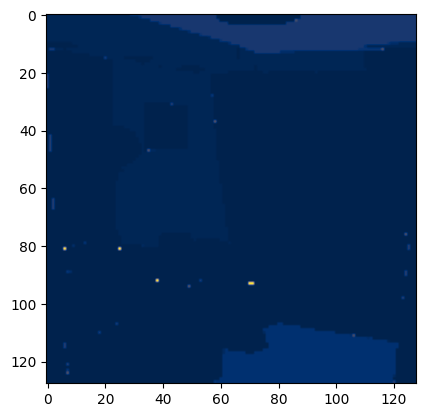

In [176]:
plt.imshow(mask_dataset[0],cmap='cividis')

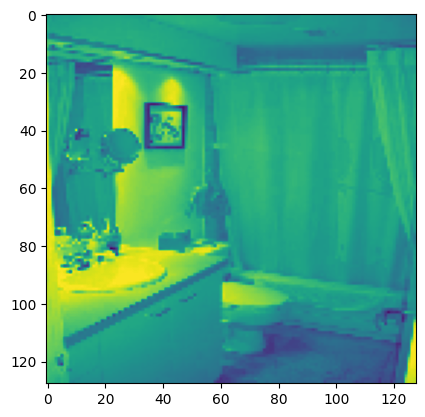

In [177]:
plt.imshow(image_dataset[0])

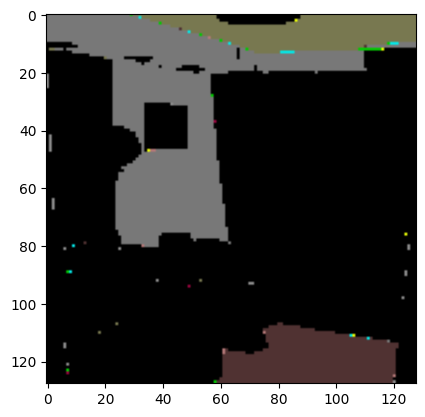

In [178]:
plt.imshow(masked_image_dataset[0])

In [179]:
masked_image_dataset[0].shape

(128, 128, 3)

In [3]:
os.mkdir('Street/images/validation')

FileNotFoundError: [Errno 2] No such file or directory: 'Street/images/validation'

In [ ]:
traing_img_path = r"/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training"
annotation_img_path = r"/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training"

street_training_img = "/kaggle/working/Street/images/training"
street_training_mask = "/kaggle/working/Street/annotations/training"

In [ ]:
!ls -lrt /content/drive/MyDrive/ADEChallengeData2016/Street/images/training/

In [ ]:
!ls -lrt /content/drive/MyDrive/ADEChallengeData2016/Street/annotations/training/


*Copying training images*

In [ ]:
import shutil

for i in range(16858,21000):
  img_name = 'ADE_train_000'+str(i)+'.jpg'
  mask_name = 'ADE_train_000'+str(i)+'.png'

  #print(img_name)
  #print(mask_name)
  #print(i)

  img_path = os.path.join(traing_img_path,img_name)
  mask_path = os.path.join(annotation_img_path,mask_name)
  print(img_path)
  print(mask_path)

  #print(os.path.exists(img_path) , os.path.exists(mask_path))
  print(i)

  if os.path.exists(img_path) and os.path.exists(mask_path):
    shutil.copy(img_path,street_training_img)
    shutil.copy(mask_path,street_training_mask)




*Copying validation images* **bold text**

In [ ]:
street_validation_img = "/kaggle/working/Street/images/validation"
street_validation_mask = "/kaggle/working/Street/annotations/validation"

validation_img_path = r"/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/validation"
validation_annotation_img_path = r"/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/validation"

In [ ]:
import shutil

for i in range(777,1000) : #(1995)
  img_name = 'ADE_val_00000'+str(i)+'.jpg'
  mask_name = 'ADE_val_00000'+str(i)+'.png'

  #print(img_name)
  #print(mask_name)
  #print(i)

  img_path = os.path.join(validation_img_path,img_name)
  mask_path = os.path.join(validation_annotation_img_path,mask_name)
  print(img_path)
  print(mask_path)

  #print(os.path.exists(img_path) , os.path.exists(mask_path))
  print(i)

  if os.path.exists(img_path) and os.path.exists(mask_path):
    shutil.copy(img_path,street_validation_img)
    shutil.copy(mask_path,street_validation_mask)


In [ ]:
street_training_img = "/kaggle/working/Street/images/training/*"
street_training_mask = "/kaggle/working/Street/annotations/training"

street_validation_img = "/kaggle/working/Street/images/validation/*"
street_validation_mask = "/kaggle/working/Street/annotations/validation"

In [ ]:
multipleImages = glob.glob(street_training_img)
random_images = sample(multipleImages, min(500, len(multipleImages)))
#random_images = sample(range(20000), random.randint(10,40))

In [ ]:
random_images

In [ ]:
#Selecting annotations and images
iamges_for_training = []
iamges_for_training_annotations = []

In [ ]:
def load_images_bw_mask(image_path):
    image = cv2.imread(image_path,0)
    #print(image.shape)
    #image = cv2.cvtColor(image)

    image = cv2.resize(image, (128, 128))
    image = Image.fromarray(image)
    image = np.array(image)
    return image

In [ ]:
def load_images_bw(image_path):
    image = cv2.imread(image_path,1)
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))
    image = Image.fromarray(image)
    image = np.array(image)
    return image

In [ ]:
j=0
image_dataset = []
mask_images = []

In [ ]:
def image_selection(traing_img_path, annotation_path):
  multipleImages = glob.glob(traing_img_path)
  random_images = list(sample(multipleImages, min(500, len(multipleImages))))
  mask_images = []
  image_dataset = []
  mask_dataset = []
  i=0

  for image in random_images:
    #print(image)
    if image.endswith(".jpg"):
        img_path = os.path.join(traing_img_path,image)
        mask_name = img_path.split('.jpg')[0] + '.png'
        mask_name = mask_name.replace("images", "annotations")
        #mask_images.append(mask_name)
        image_dataset.append(load_images_bw(img_path)[:,:,0])

        if mask_name.endswith(".png"):
          mask_dataset.append(load_images_bw_mask(mask_name))
        i=i+1
        if i==500:
          break

  return image_dataset,mask_dataset


In [ ]:
image_dataset,mask_dataset = image_selection(street_training_img,street_training_mask)

In [ ]:
mask_dataset[0]

In [241]:
len(image_dataset)


51

In [242]:
len(mask_images),

NameError: name 'mask_images' is not defined

In [ ]:
mask_images

In [ ]:
!nvidia-smi

In [ ]:
len(mask_images)


In [115]:
len(mask_dataset)

2

In [180]:
n_classes = len(np.unique(mask_dataset))

In [181]:
n_classes

13

In [182]:
np.unique(mask_dataset[image_number])

array([ 0,  1,  2,  3,  4,  5,  6,  7, 12], dtype=uint8)

In [186]:
np.unique(mask_dataset[image_number])

array([ 0,  1,  2,  3,  4,  5,  6,  7, 12], dtype=uint8)

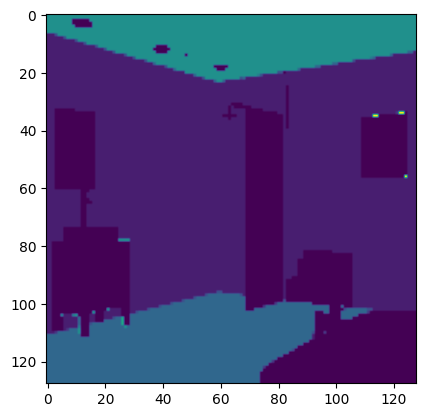

In [183]:
plt.imshow(mask_dataset[image_number])

In [187]:
np.unique(mask_dataset[1])

array([ 0,  1,  2,  3,  4,  5,  6,  7, 12], dtype=uint8)

286
[  0   1   2   3   4   5   6   7  12  13 127]


Text(0.5, 1.0, 'Mask')

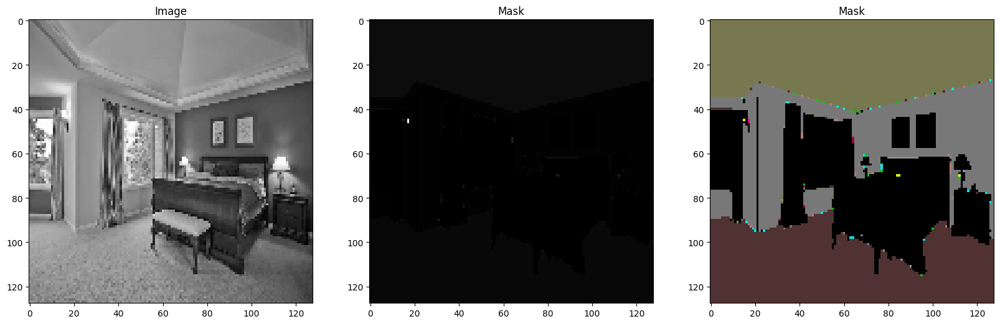

In [188]:

# Sanity check...
import random
image_number = random.randint(0, len(image_dataset))
print(image_number)
print(np.unique(mask_dataset[image_number]))
#image_number=45
plt.figure(figsize=(20, 20))
plt.subplot(131)
plt.imshow(image_dataset[image_number],cmap='gray')
plt.title("Image")
plt.subplot(132)
plt.imshow(mask_dataset[image_number],cmap='gray')
plt.title("Mask")
plt.subplot(133)
plt.imshow(masked_image_dataset[image_number])
plt.title("Mask")

In [189]:
#Convert list to array for machine learning processing
train_images = np.array(image_dataset)

In [190]:
train_images.shape

(899, 128, 128)

In [191]:
train_images = np.expand_dims(train_images, axis=3)

In [192]:
train_images.shape

(899, 128, 128, 1)

In [193]:
#Convert list to array for machine learning processing
train_masks = np.array(mask_dataset)

In [194]:
train_masks.shape

(899, 128, 128)

In [195]:
#Encode labels... but multi dim array so need to flatten, encode and reshape
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
n, h, w = train_masks.shape
train_masks_reshaped = train_masks.reshape(-1,1)
print(np.unique(train_masks_reshaped))
train_masks_reshaped_encoded = labelencoder.fit_transform(train_masks_reshaped)
print(np.unique(train_masks_reshaped_encoded))
train_masks_encoded_original_shape = train_masks_reshaped_encoded.reshape(n, h, w)

np.unique(train_masks_encoded_original_shape)

[  0   1   2   3   4   5   6   7  12  13  49 121 127]


/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[ 0  1  2  3  4  5  6  7  8  9 10 11 12]


array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [196]:
from keras.utils import normalize
train_images = normalize(train_images,axis=1)#

In [197]:
train_masks_input = np.expand_dims(train_masks_encoded_original_shape, axis=3)

In [198]:
train_masks_input.shape, train_images.shape


((899, 128, 128, 1), (899, 128, 128, 1))

In [199]:
from sklearn.model_selection import train_test_split
X1, X_test, y1, y_test = train_test_split(train_images, train_masks_input, test_size = 0.10, random_state = 101)

In [200]:
X1.shape, X_test.shape, y1.shape, y_test.shape

((809, 128, 128, 1), (90, 128, 128, 1), (809, 128, 128, 1), (90, 128, 128, 1))

In [201]:
np.unique(train_masks_input)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [202]:
n_classes=len(np.unique(train_masks_input))

In [204]:
n_classes

13

In [205]:
from keras.utils import to_categorical
train_masks_cat = to_categorical(y1, num_classes=n_classes)
y_train_cat = train_masks_cat.reshape((y1.shape[0], y1.shape[1], y1.shape[2], n_classes))

test_masks_cat = to_categorical(y_test, num_classes=n_classes)
y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))

In [206]:
###############################################################
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight(class_weight = "balanced", classes= np.unique(train_masks_reshaped_encoded), y= train_masks_reshaped_encoded)


print("Class weights are...:", class_weights)

Class weights are...: [1.47707416e-01 3.15850564e-01 4.04296476e+00 3.48911435e+00
 8.91273760e-01 7.90462002e+00 8.49890795e-01 2.89367032e+01
 4.31231109e+01 2.57059764e+01 8.41765688e+02 1.84530393e+03
 1.57297878e+02]


In [207]:
IMG_HEIGHT = X1.shape[1]
IMG_WIDTH  = X1.shape[2]
IMG_CHANNELS = X1.shape[3]

In [209]:
print(IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS)


128 128 1


In [210]:
n_classes

13

In [211]:
# https://youtu.be/XyX5HNuv-xE
# https://youtu.be/q-p8v1Bxvac
"""
Standard Unet
Model not compiled here, instead will be done externally to make it
easy to test various loss functions and optimizers.
"""


from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda




################################################################
def multi_unet_model(n_classes=n_classes, IMG_HEIGHT=256, IMG_WIDTH=256, IMG_CHANNELS=1):
#Build the model
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
    s = inputs

    #Contraction path
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)

    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    #Expansive path
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9)

    model = Model(inputs=[inputs], outputs=[outputs])

    #NOTE: Compile the model in the main program to make it easy to test with various loss functions
    #model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    #model.summary()

    return model


In [212]:
def get_model():
    return multi_unet_model(n_classes=n_classes, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH, IMG_CHANNELS=IMG_CHANNELS)

model = get_model()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_38 (Conv2D)             (None, 128, 128, 16  160         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_18 (Dropout)           (None, 128, 128, 16  0           ['conv2d_38[0][0]']              
                                )                                                           

In [213]:
from tensorflow.keras.callbacks import ModelCheckpoint


filepath="/kaggle/working/weights/weights-13-improvement-fixed-images-{epoch:03d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, savemode='max')
callbacks_list = [checkpoint]

In [214]:
os.mkdir('weights')

FileExistsError: [Errno 17] File exists: 'weights'

In [42]:
model.load_weights("//kaggle/working/test_0.47_val.hdf5")

FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = '//kaggle/working/test_0.47_val.hdf5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [ ]:
cp /content/weights-improvement-fixed-images-043-0.68.hdf5 /content/drive/MyDrive/Scene-Parsing/model/

In [215]:
history = model.fit(X1, y_train_cat,
                    batch_size = 16,
                    verbose=1,
                    epochs=200,
                    validation_data=(X_test, y_test_cat),
                    #class_weight=class_weights,
                    callbacks=callbacks_list,
                    shuffle=True)

Epoch 1/200


2024-03-18 22:12:46.507212: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_2/dropout_18/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


51/51 [==============================] - ETA: 0s - loss: 1.8816 - accuracy: 0.4626
Epoch 1: val_accuracy improved from -inf to 0.53975, saving model to /kaggle/working/weights/weights-13-improvement-fixed-images-001-0.54.hdf5
51/51 [==============================] - 14s 105ms/step - loss: 1.8816 - accuracy: 0.4626 - val_loss: 1.5351 - val_accuracy: 0.5397
Epoch 2/200
51/51 [==============================] - ETA: 0s - loss: 1.3583 - accuracy: 0.5235
Epoch 2: val_accuracy improved from 0.53975 to 0.56955, saving model to /kaggle/working/weights/weights-13-improvement-fixed-images-002-0.57.hdf5
51/51 [==============================] - 3s 50ms/step - loss: 1.3583 - accuracy: 0.5235 - val_loss: 1.3123 - val_accuracy: 0.5695
Epoch 3/200
50/51 [============================>.] - ETA: 0s - loss: 1.1694 - accuracy: 0.5593
Epoch 3: val_accuracy improved from 0.56955 to 0.57014, saving model to /kaggle/working/weights/weights-13-improvement-fixed-images-003-0.57.hdf5
51/51 [=======================

In [ ]:
model.load_weights("/kaggle/working/weights/weights-151-improvement-fixed-images-200-0.41.hdf5")


In [ ]:
history = model.fit(X1, y_train_cat,
                    batch_size = 8,
                    verbose=1,
                    epochs=100,
                    validation_data=(X_test, y_test_cat),
                    #class_weight=class_weights,
                    callbacks=callbacks_list,
                    shuffle=False)

In [ ]:
model = create_model()
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model.fit(x=x_train,
          y=y_train,
          epochs=5,
          validation_data=(x_test, y_test),
          callbacks=[tensorboard_callback])

In [253]:
model.save('UNET_test_acc0.94_val0.73.hdf5')

In [ ]:
model.save('/content/drive/MyDrive/Scene-Parsing/model/test_0.47.hdf5')

In [216]:
_, acc = model.evaluate(X_test, y_test_cat)
print("Accuracy is = ", (acc * 100.0), "%")

3/3 [==============================] - 2s 388ms/step - loss: 1.3752 - accuracy: 0.7338
Accuracy is =  73.38162064552307 %


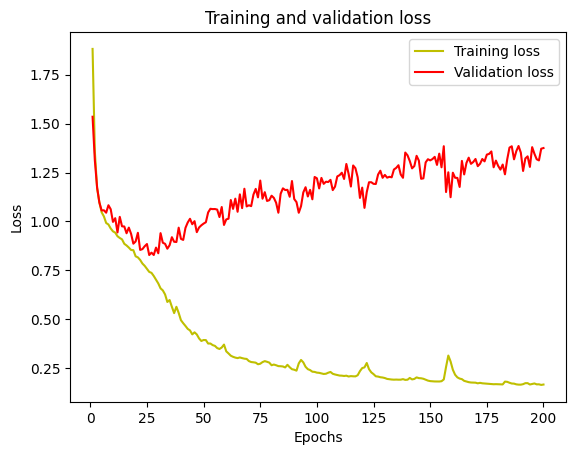

In [217]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

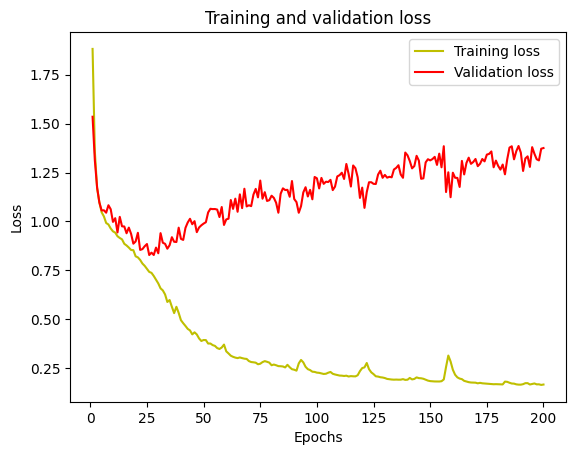

In [218]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

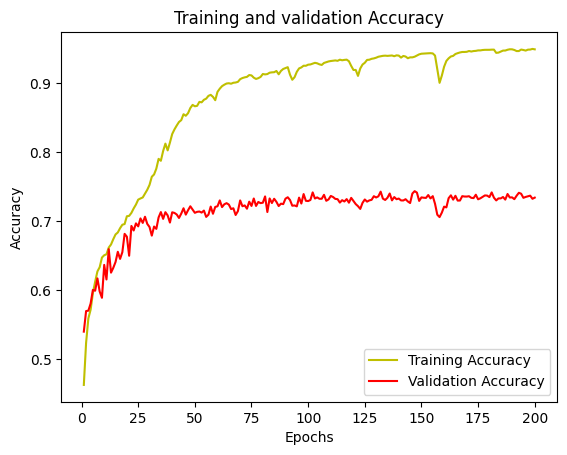

In [219]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

plt.plot(epochs, acc, 'y', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

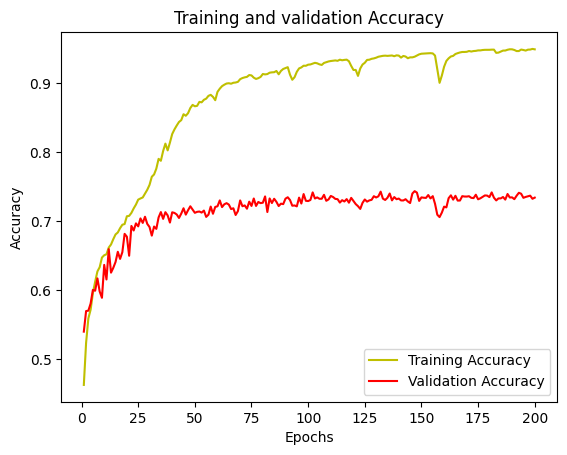

In [220]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

plt.plot(epochs, acc, 'y', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
history.history

In [ ]:
with open("/content/drive/MyDrive/Scene-Parsing/hist3.txt", 'w') as f:
    for key, value in history.history.items():
        f.write('%s:%s\n' % (key, value))


In [254]:
my_file = open('./test.txt','w+')

In [256]:
with open('./test.txt','w+') as f:
    for key, value in history.history.items():
        f.write('%s:%s\n' % (key, value))

In [221]:
y_pred=model.predict(X_test)
y_pred_argmax=np.argmax(y_pred, axis=3)

3/3 [==============================] - 0s 29ms/step


In [222]:
y_test.shape

(90, 128, 128, 1)

In [223]:
#Using built in keras function
from keras.metrics import MeanIoU
n_classes = n_classes
IOU_keras = MeanIoU(num_classes=n_classes)
IOU_keras.update_state(y_test[:,:,:,0], y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

Mean IoU = 0.234303


In [224]:
#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[0,3] + values[1,0]+ values[2,0]+ values[3,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[1,3] + values[0,1]+ values[2,1]+ values[3,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[2,3] + values[0,2]+ values[1,2]+ values[3,2])
class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2] + values[0,3]+ values[1,3]+ values[2,3])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)
print("IoU for class4 is: ", class4_IoU)


[[6.52448e+05 8.49780e+04 8.49000e+02 2.24000e+03 4.52920e+04 1.77900e+03
  5.22200e+03 1.45900e+03 1.91000e+02 4.84000e+02 0.00000e+00 0.00000e+00
  4.10000e+02]
 [7.86450e+04 2.36524e+05 2.02400e+03 3.54800e+03 2.97900e+03 2.57700e+03
  1.29180e+04 0.00000e+00 0.00000e+00 2.70000e+01 0.00000e+00 0.00000e+00
  2.00000e+00]
 [3.11840e+04 8.75000e+02 9.07200e+03 4.55000e+02 1.93500e+03 1.38000e+03
  1.02000e+02 0.00000e+00 0.00000e+00 2.75000e+02 0.00000e+00 0.00000e+00
  5.95000e+02]
 [4.75000e+03 1.34310e+04 4.45000e+02 1.46320e+04 1.63000e+02 3.93000e+02
  2.20000e+03 0.00000e+00 0.00000e+00 3.00000e+00 0.00000e+00 0.00000e+00
  2.00000e+00]
 [3.71970e+04 1.94800e+03 3.50000e+01 4.00000e+00 6.92510e+04 2.60000e+01
  3.28000e+02 0.00000e+00 0.00000e+00 3.00000e+01 0.00000e+00 0.00000e+00
  9.00000e+00]
 [1.26290e+04 1.35900e+03 8.86000e+02 4.90000e+02 1.20000e+02 9.05700e+03
  1.38000e+02 0.00000e+00 0.00000e+00 1.00000e+01 0.00000e+00 0.00000e+00
  1.98000e+02]
 [8.00700e+03 1.80240e

Text(0.5, 1.0, 'Mask')

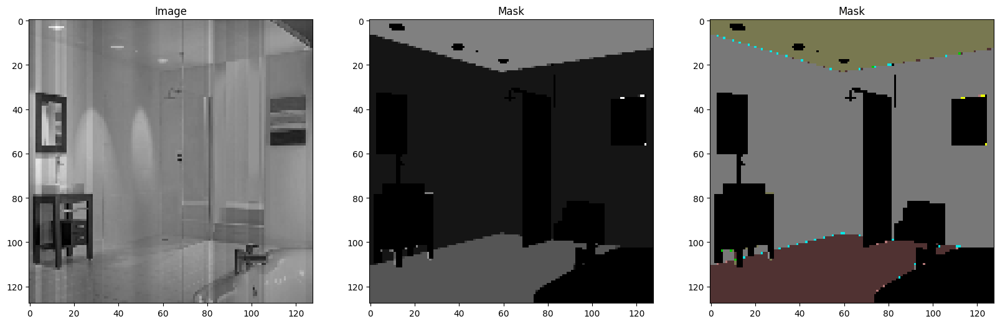

In [225]:
plt.figure(figsize=(20, 20))
plt.subplot(131)
plt.imshow(train_images[1, :,:,0], cmap='gray')
plt.title("Image")
plt.subplot(132)
plt.imshow(train_masks[1],cmap='gray')
plt.title("Mask")
plt.subplot(133)
plt.imshow(masked_image_dataset[1],cmap='gray')
plt.title("Mask")

In [226]:
np.unique(train_masks)

array([  0,   1,   2,   3,   4,   5,   6,   7,  12,  13,  49, 121, 127],
      dtype=uint8)

In [227]:
test_img_number = random.randint(0, len(X1))

test_img = X1[test_img_number]
ground_truth=y1[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]

1/1 [==============================] - 0s 20ms/step


In [228]:
np.unique(ground_truth)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

[0 1 4]


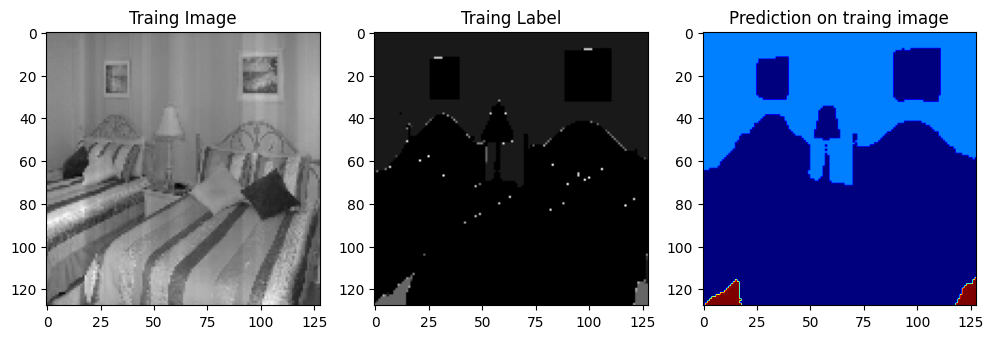

In [229]:
print(np.unique(predicted_img))
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Traing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Traing Label')
plt.imshow(ground_truth[:,:,0], cmap='gray')
plt.subplot(233)
plt.title('Prediction on traing image')
plt.imshow(predicted_img, cmap='jet')
plt.show()


In [230]:
np.unique(test_img)

array([0.00070183, 0.00206962, 0.00418327, ..., 0.16645779, 0.16763954,
       0.16921125])

In [231]:
X_test.shape

(90, 128, 128, 1)

1/1 [==============================] - 0s 19ms/step


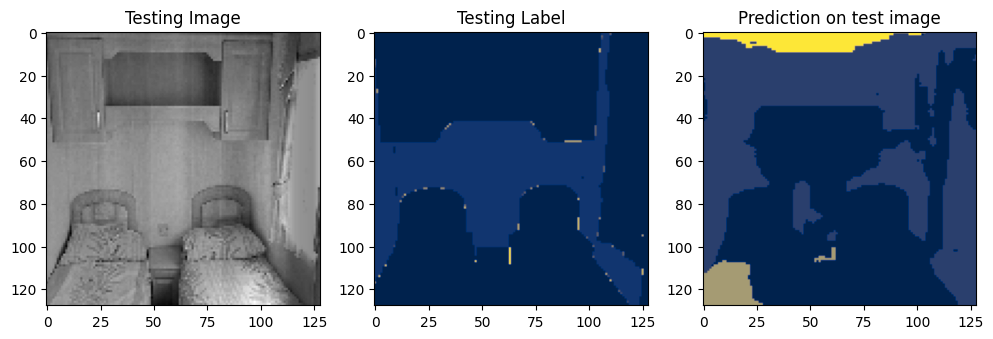

1/1 [==============================] - 0s 20ms/step


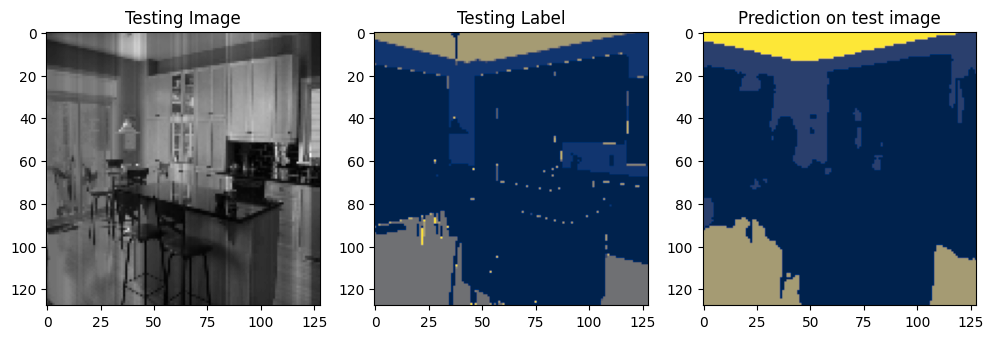

1/1 [==============================] - 0s 20ms/step


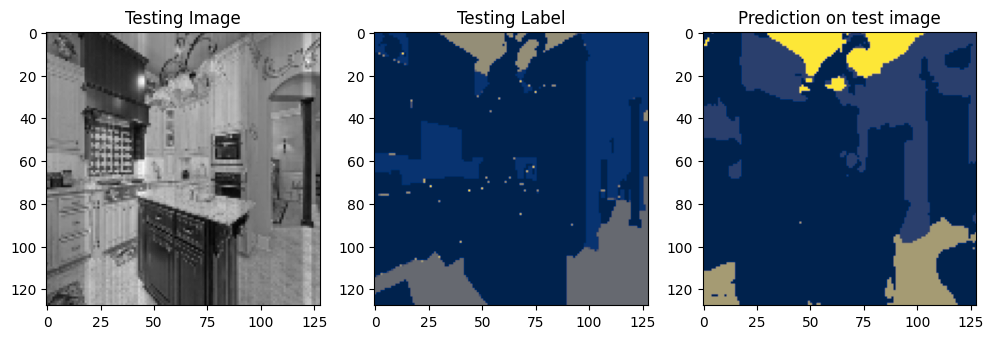

1/1 [==============================] - 0s 20ms/step


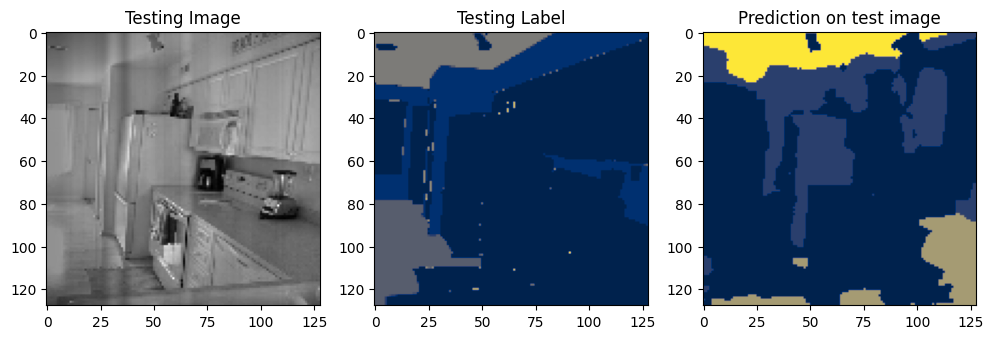

1/1 [==============================] - 0s 19ms/step


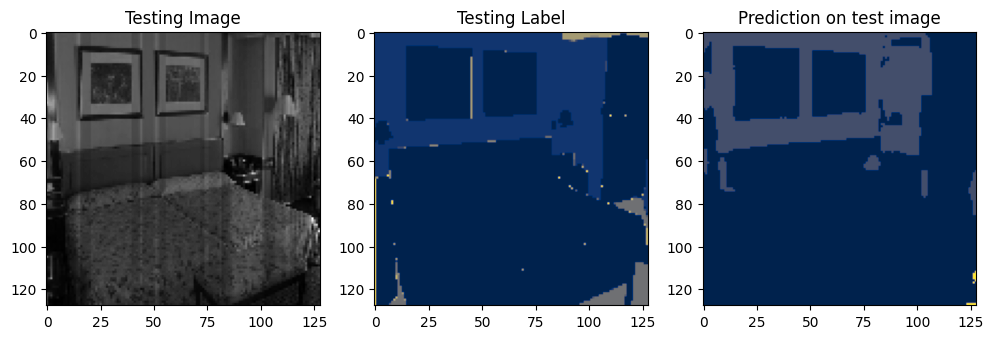

1/1 [==============================] - 0s 19ms/step


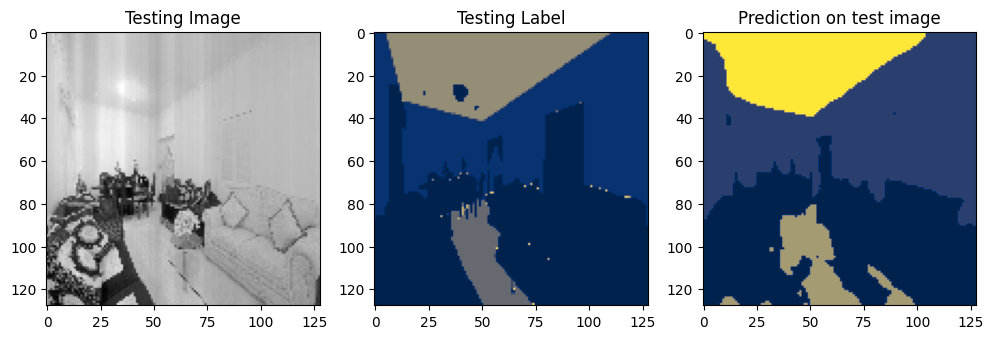

1/1 [==============================] - 0s 19ms/step


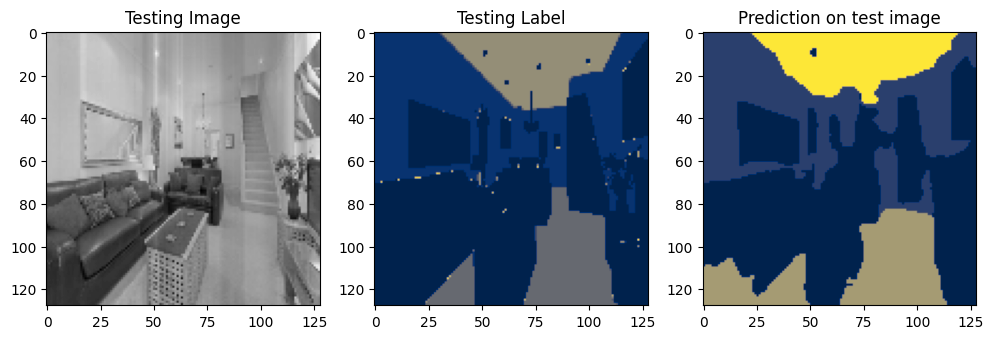

1/1 [==============================] - 0s 19ms/step


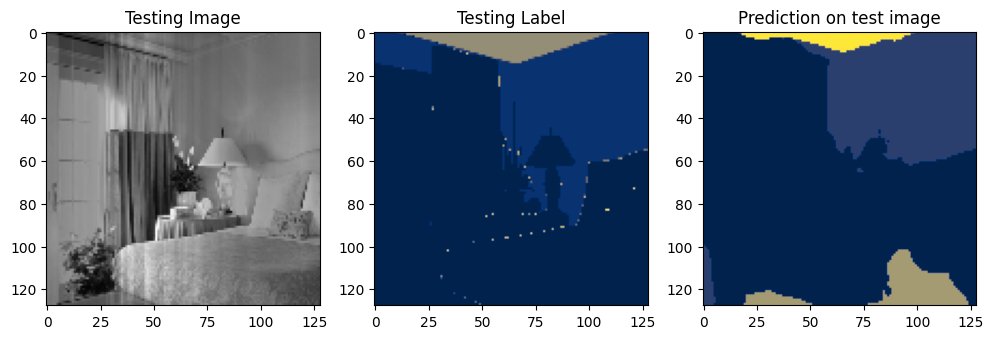

1/1 [==============================] - 0s 20ms/step


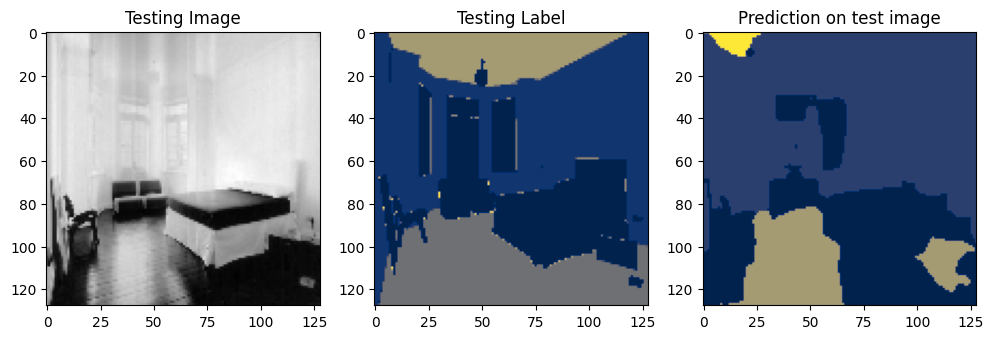

1/1 [==============================] - 0s 19ms/step


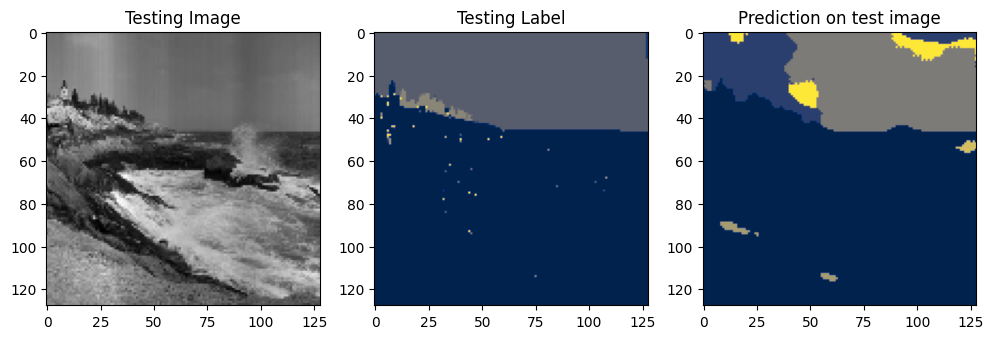

1/1 [==============================] - 0s 20ms/step


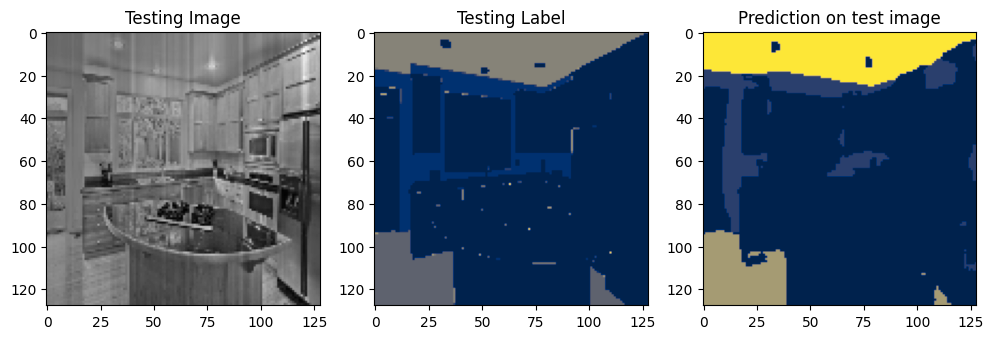

1/1 [==============================] - 0s 20ms/step


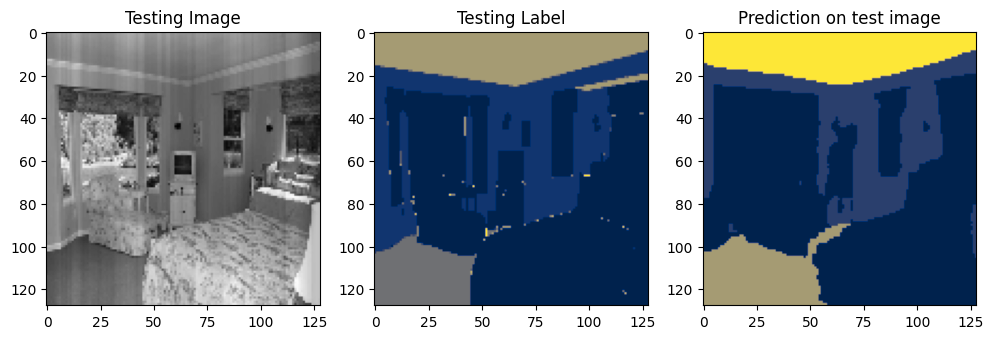

1/1 [==============================] - 0s 19ms/step


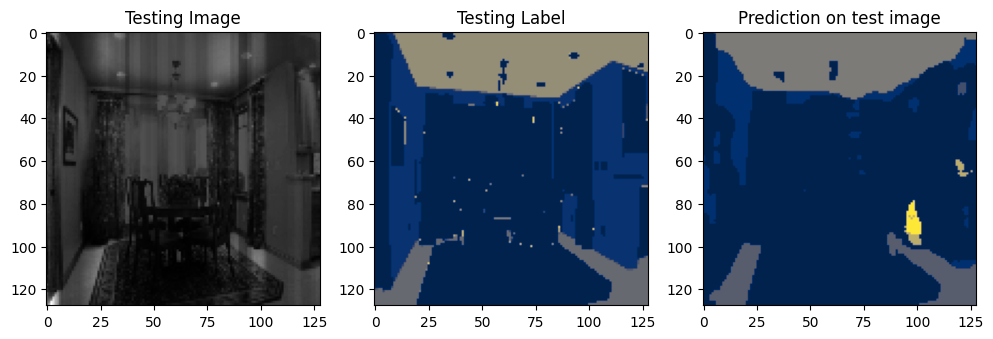

1/1 [==============================] - 0s 20ms/step


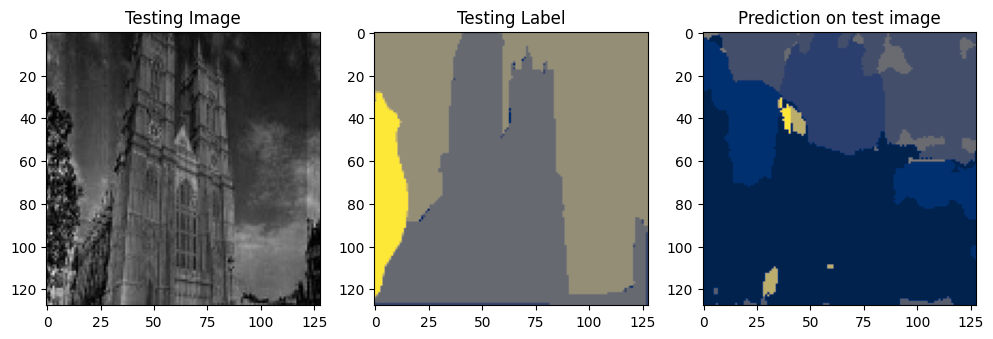

1/1 [==============================] - 0s 19ms/step


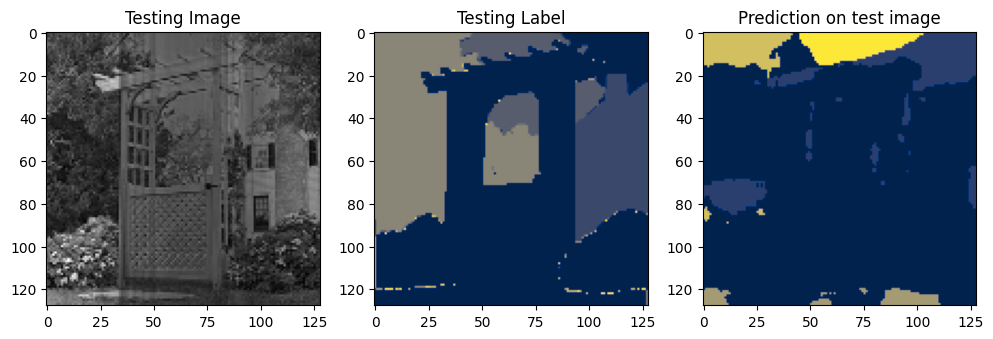

1/1 [==============================] - 0s 21ms/step


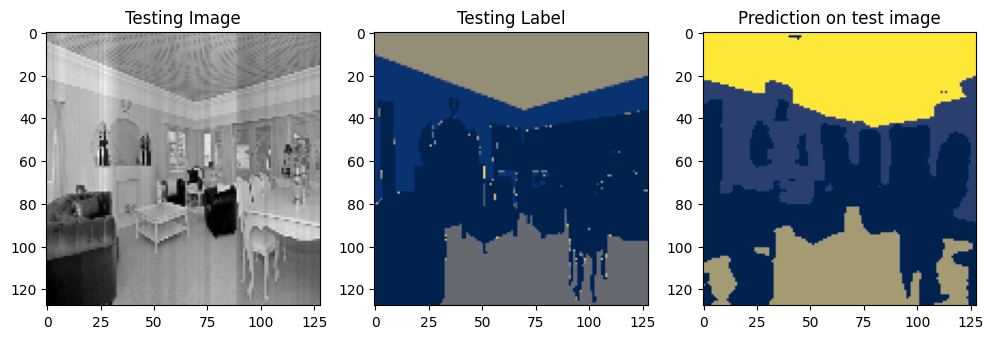

1/1 [==============================] - 0s 22ms/step


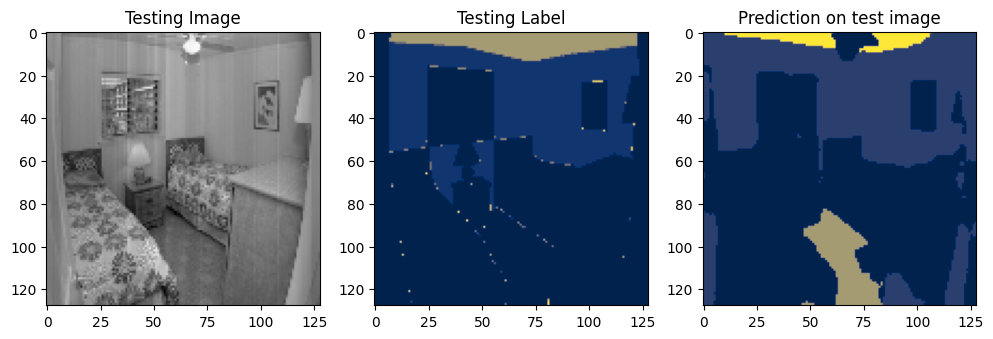

1/1 [==============================] - 0s 21ms/step


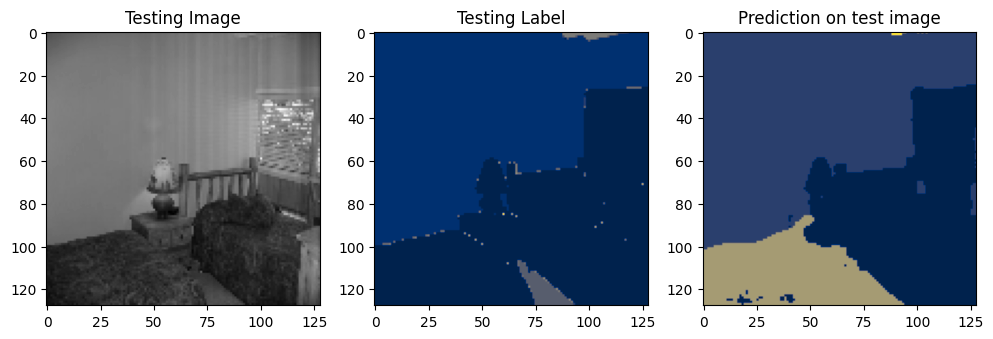

1/1 [==============================] - 0s 22ms/step


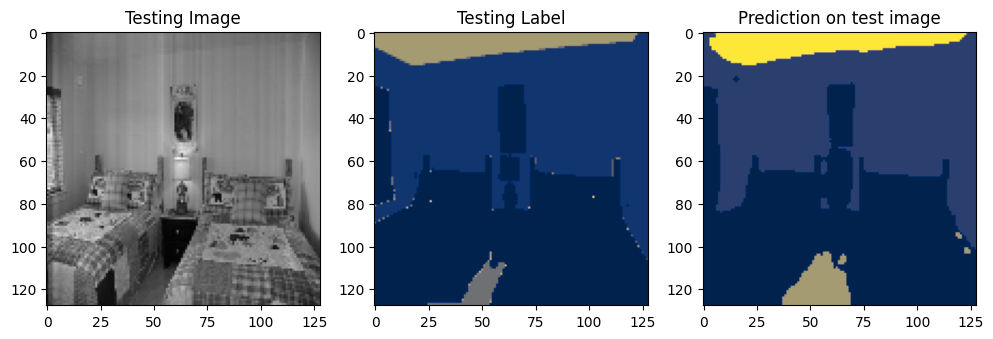

1/1 [==============================] - 0s 21ms/step


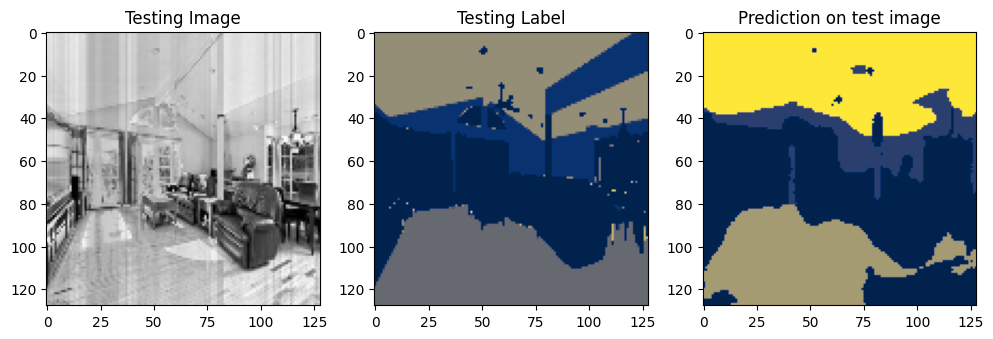

1/1 [==============================] - 0s 21ms/step


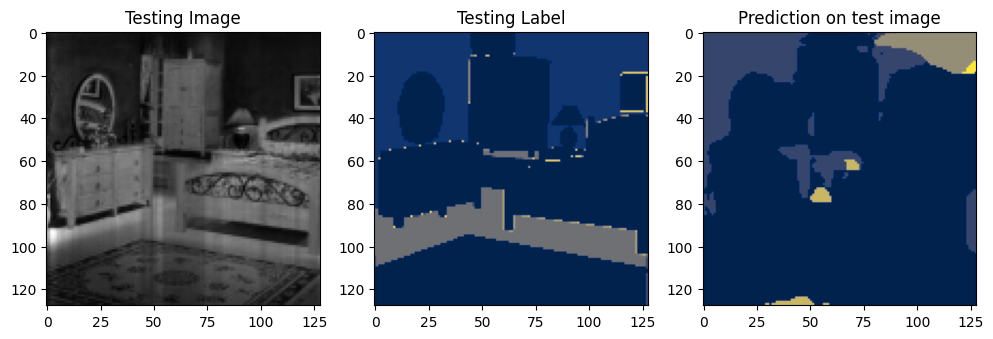

1/1 [==============================] - 0s 22ms/step


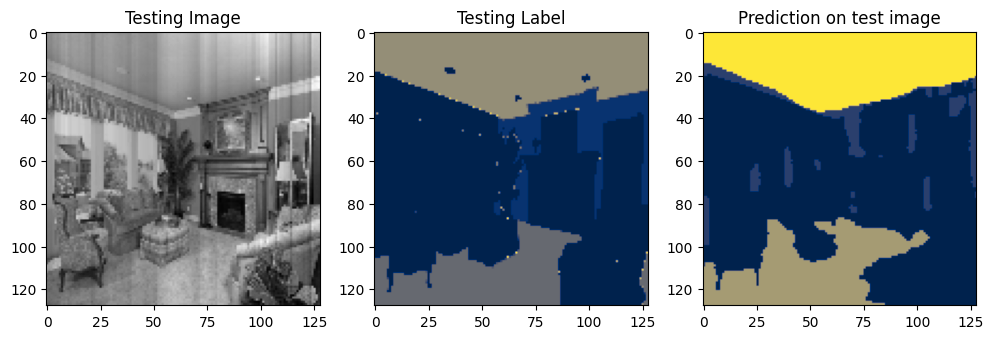

1/1 [==============================] - 0s 21ms/step


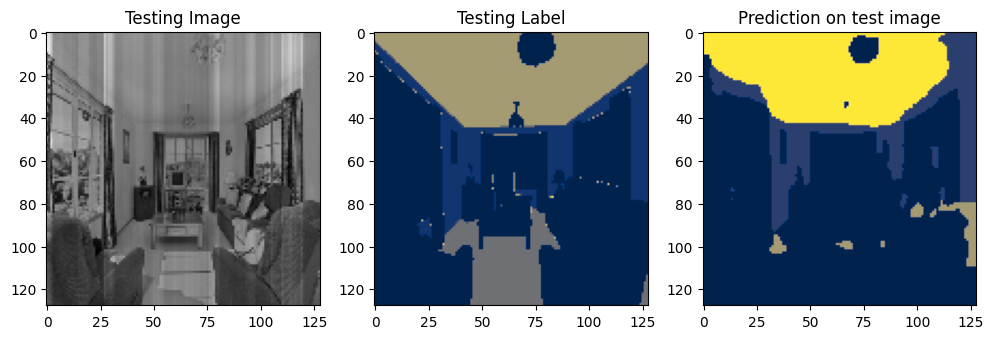

1/1 [==============================] - 0s 20ms/step


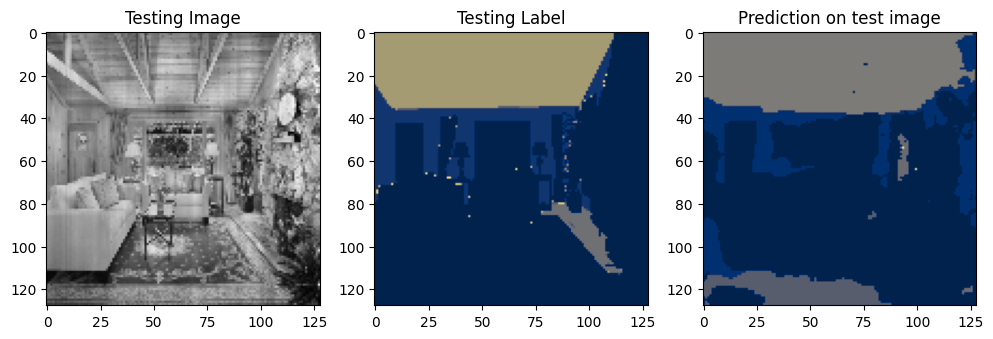

1/1 [==============================] - 0s 21ms/step


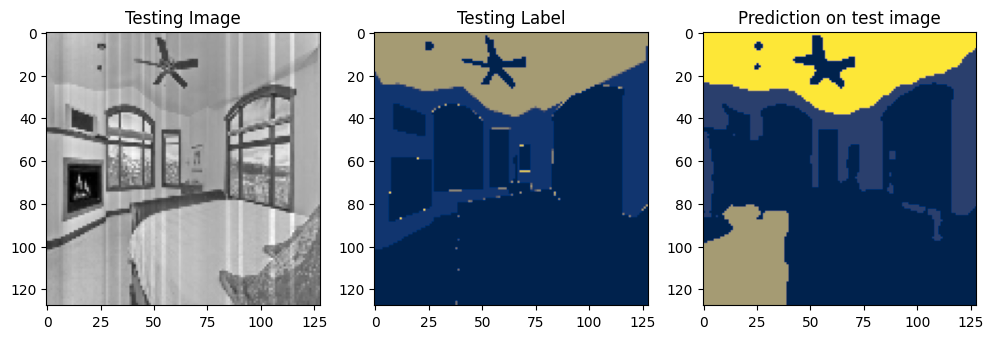

1/1 [==============================] - 0s 22ms/step


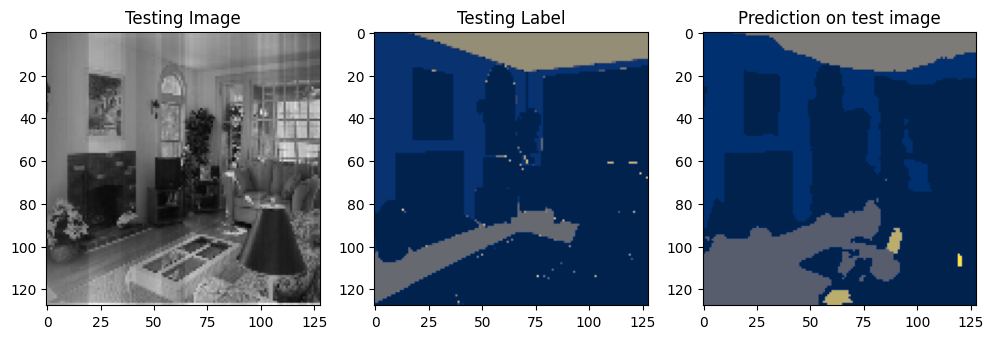

1/1 [==============================] - 0s 21ms/step


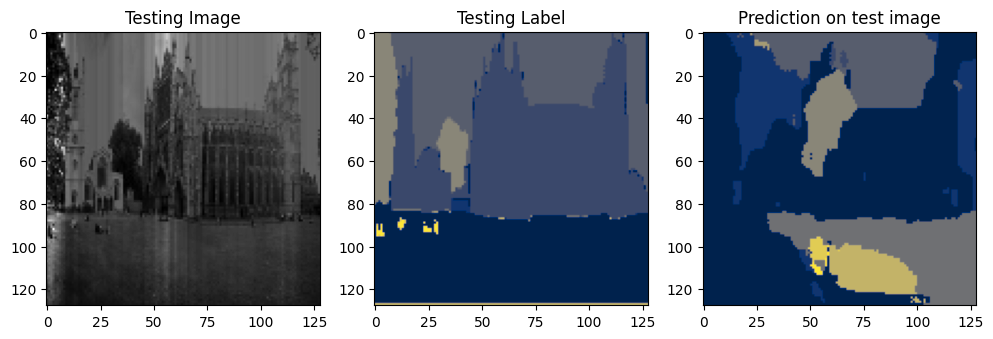

1/1 [==============================] - 0s 22ms/step


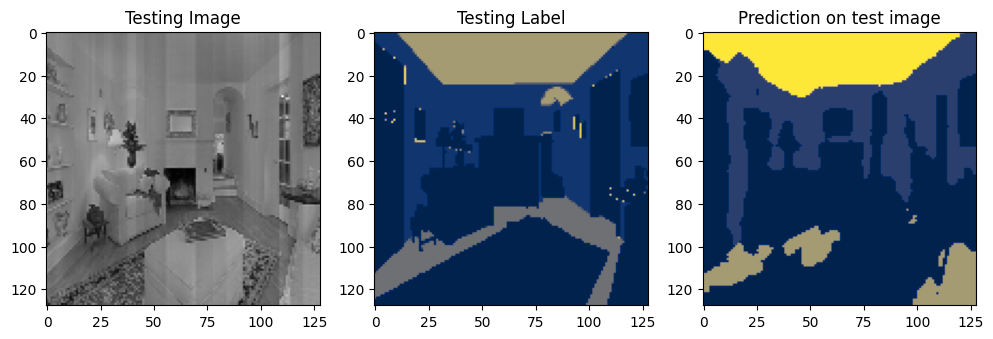

1/1 [==============================] - 0s 21ms/step


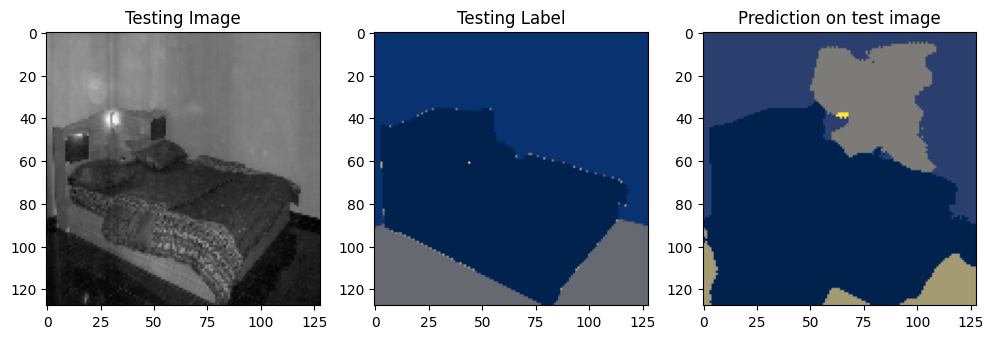

1/1 [==============================] - 0s 21ms/step


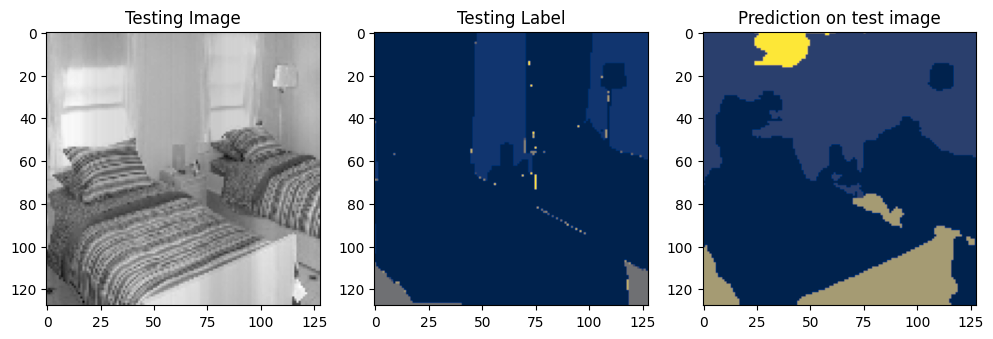

1/1 [==============================] - 0s 20ms/step


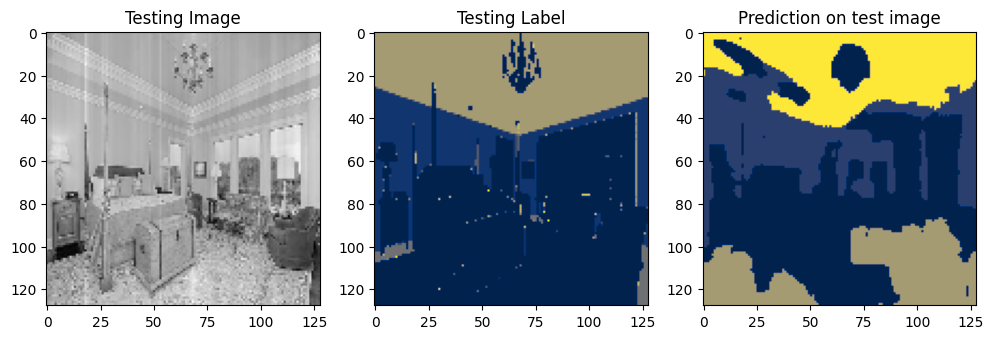

1/1 [==============================] - 0s 21ms/step


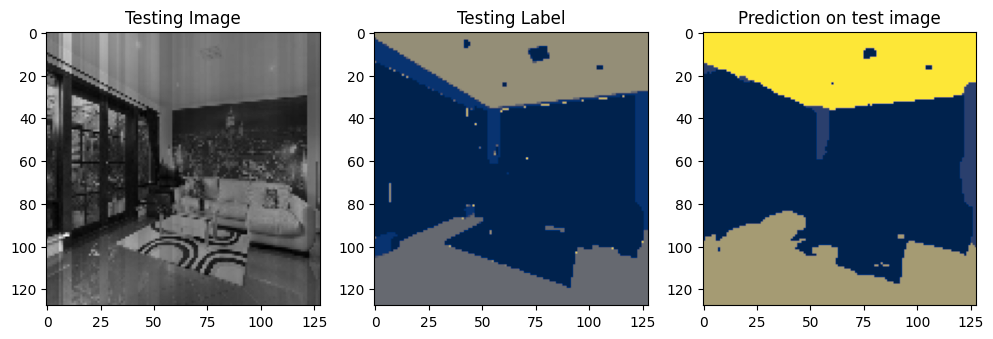

1/1 [==============================] - 0s 20ms/step


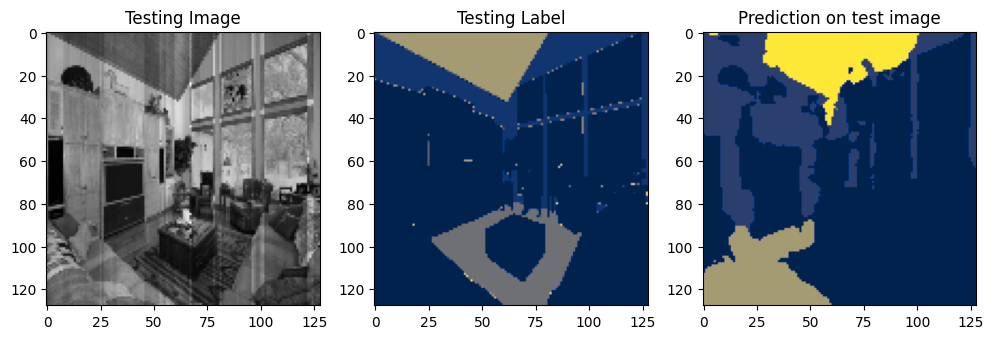

1/1 [==============================] - 0s 20ms/step


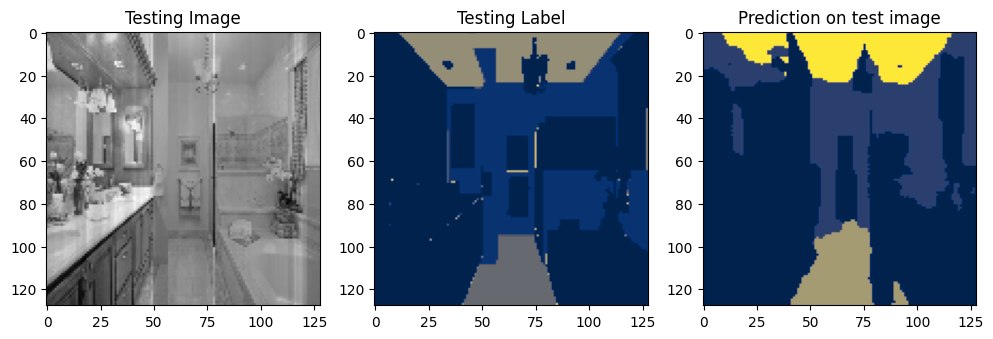

1/1 [==============================] - 0s 20ms/step


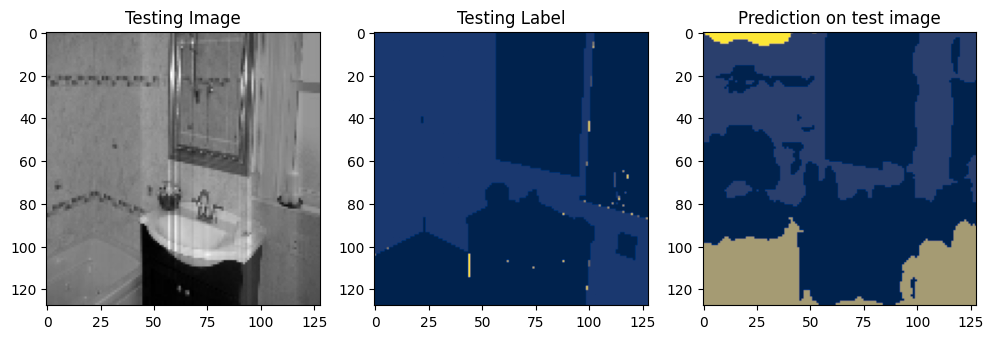

1/1 [==============================] - 0s 20ms/step


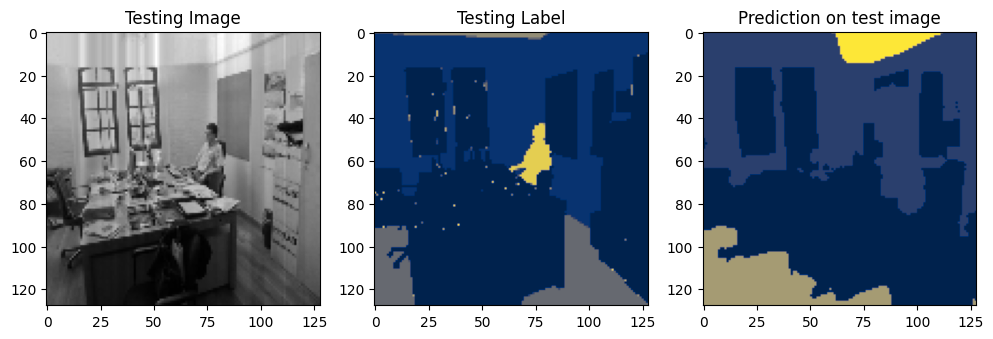

1/1 [==============================] - 0s 21ms/step


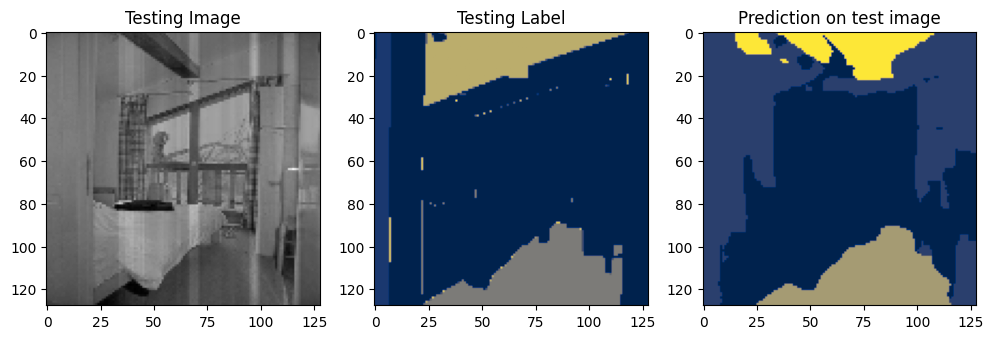

1/1 [==============================] - 0s 22ms/step


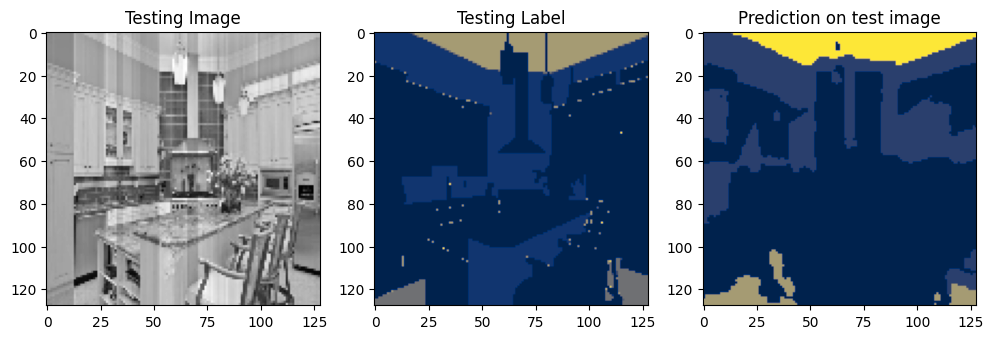

1/1 [==============================] - 0s 22ms/step


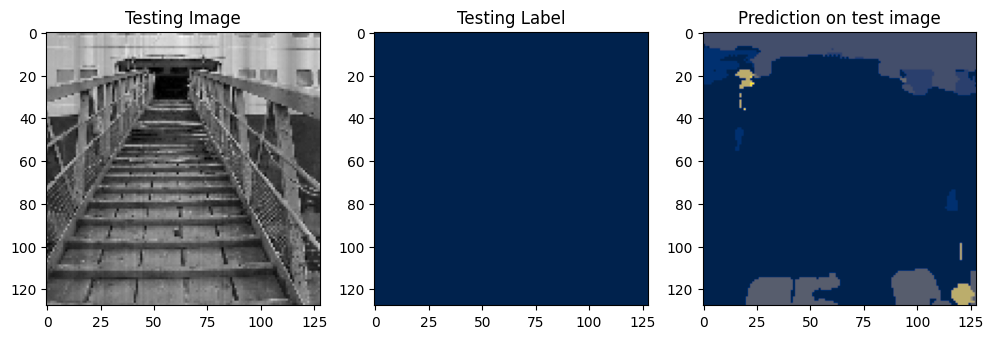

1/1 [==============================] - 0s 21ms/step


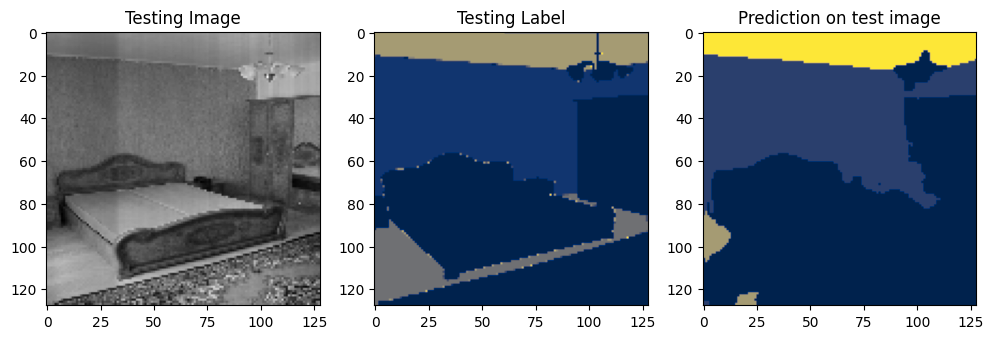

1/1 [==============================] - 0s 22ms/step


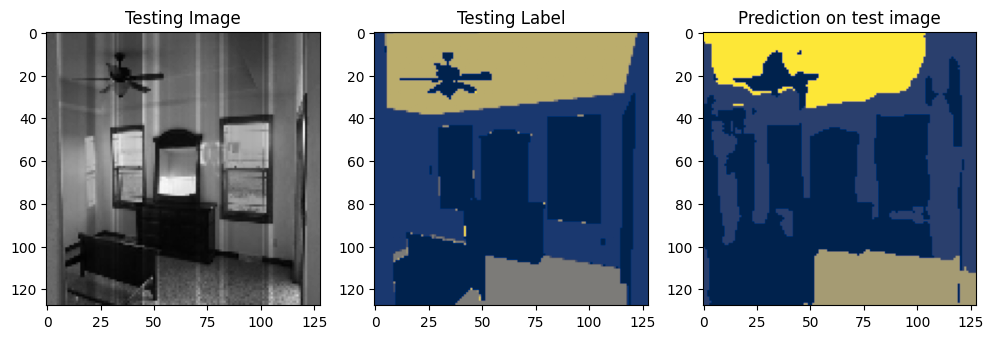

1/1 [==============================] - 0s 21ms/step


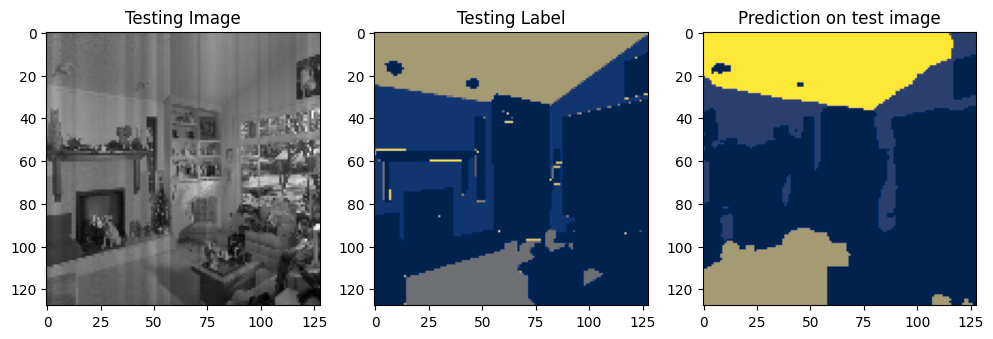

1/1 [==============================] - 0s 21ms/step


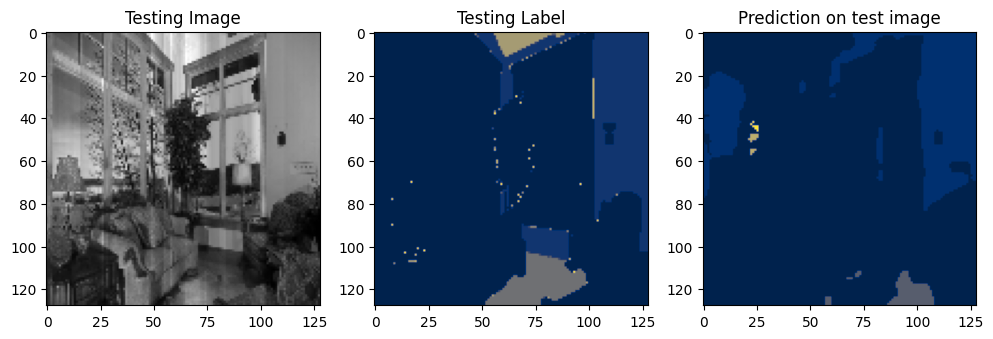

1/1 [==============================] - 0s 21ms/step


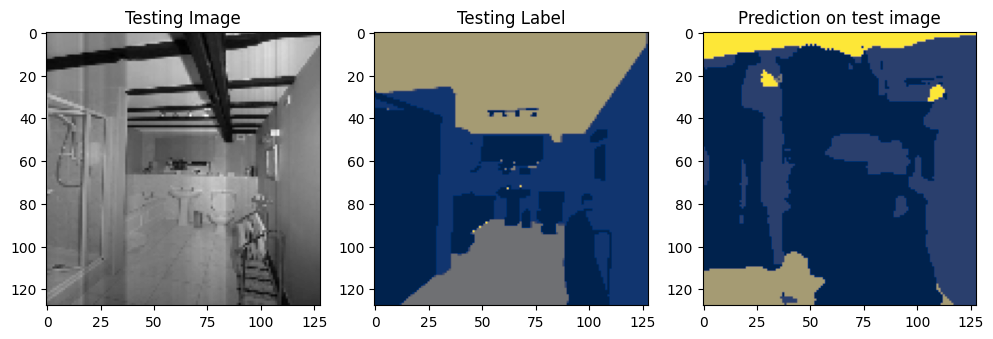

1/1 [==============================] - 0s 20ms/step


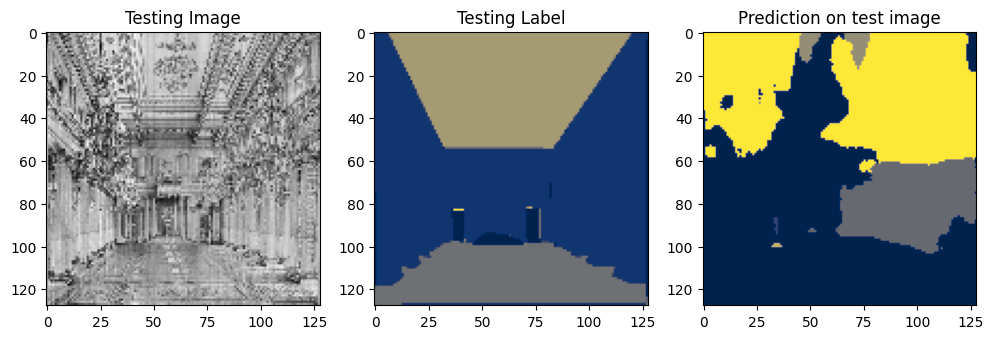

1/1 [==============================] - 0s 21ms/step


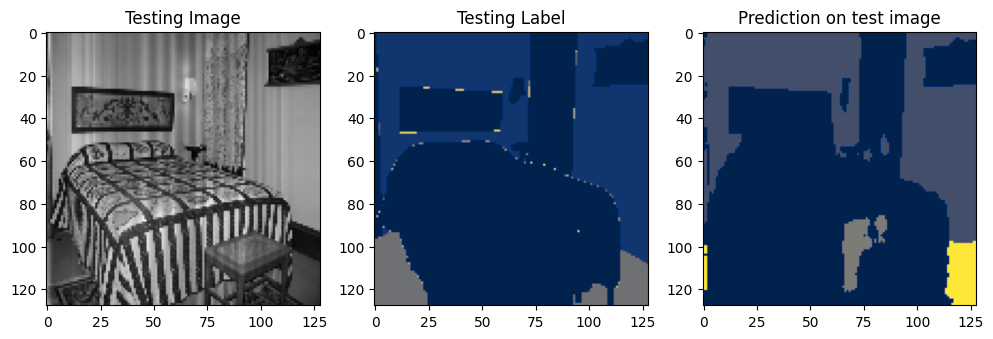

1/1 [==============================] - 0s 20ms/step


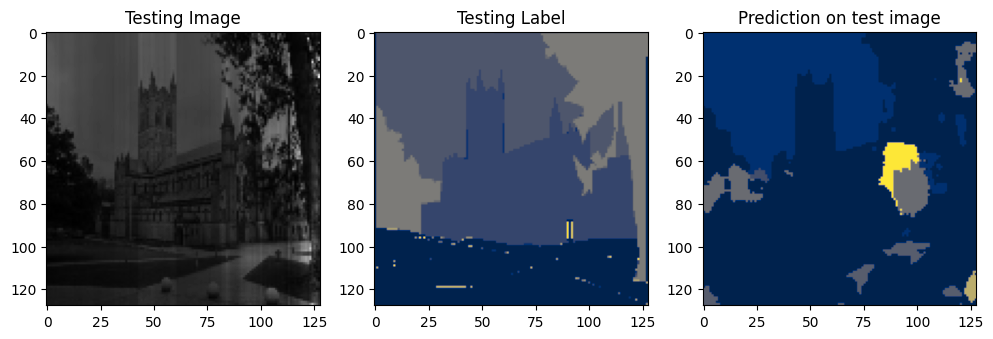

1/1 [==============================] - 0s 21ms/step


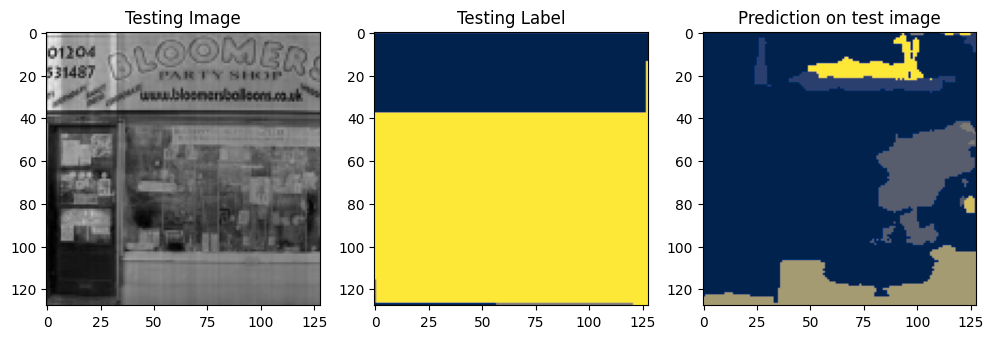

1/1 [==============================] - 0s 27ms/step


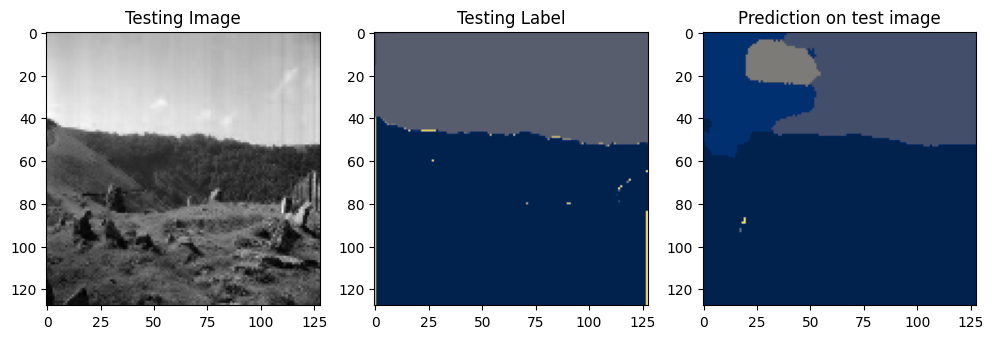

1/1 [==============================] - 0s 20ms/step


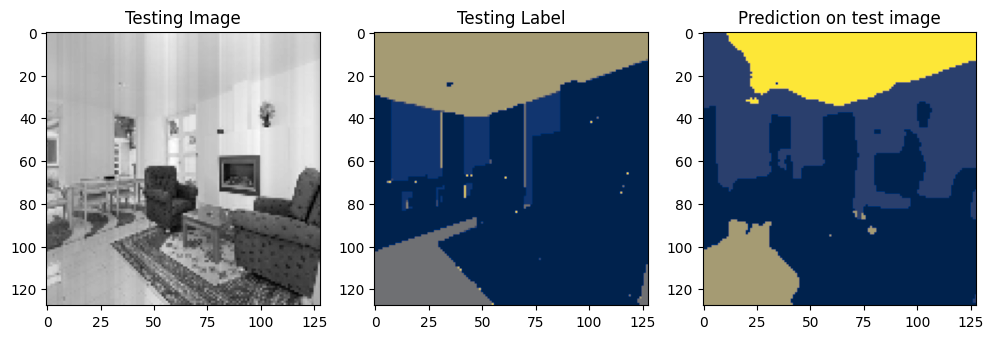

1/1 [==============================] - 0s 21ms/step


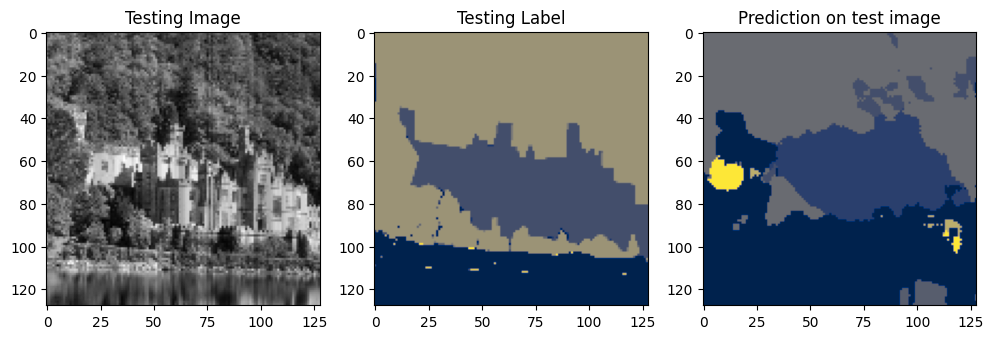

1/1 [==============================] - 0s 20ms/step


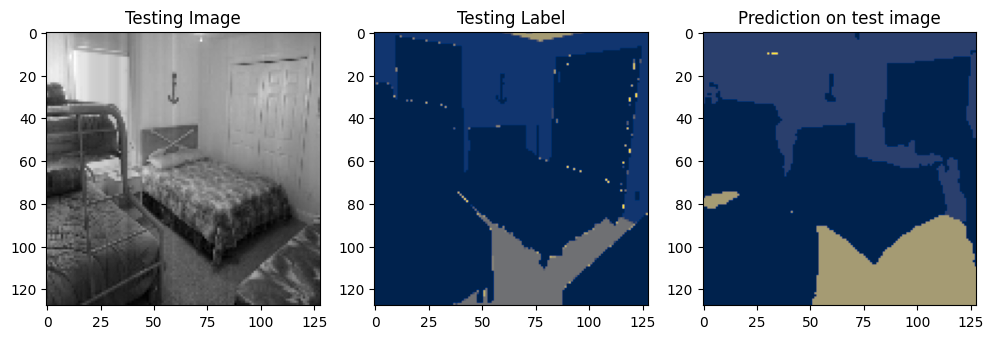

1/1 [==============================] - 0s 21ms/step


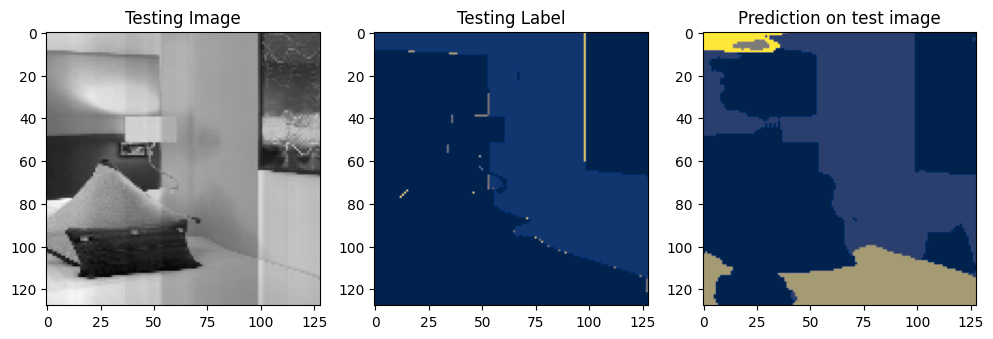

1/1 [==============================] - 0s 20ms/step


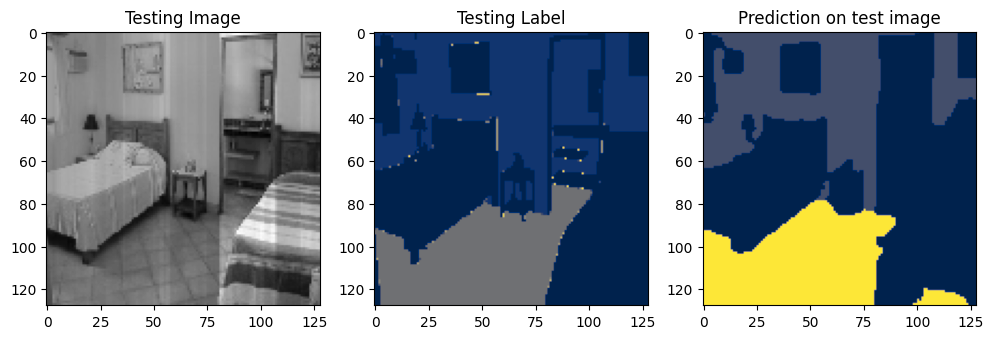

1/1 [==============================] - 0s 20ms/step


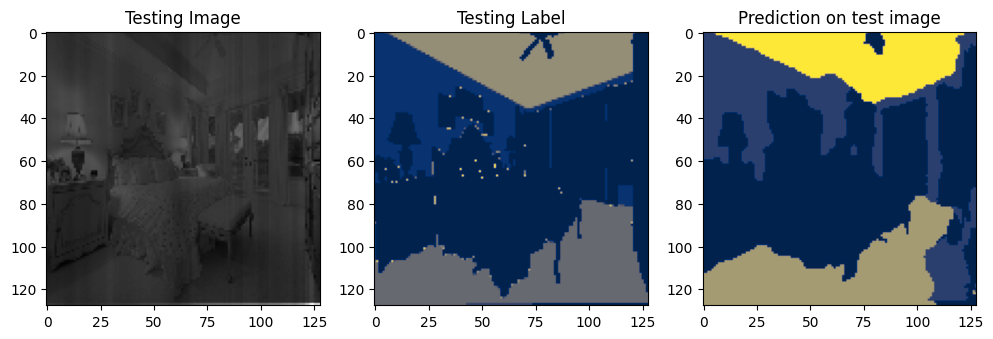

1/1 [==============================] - 0s 22ms/step


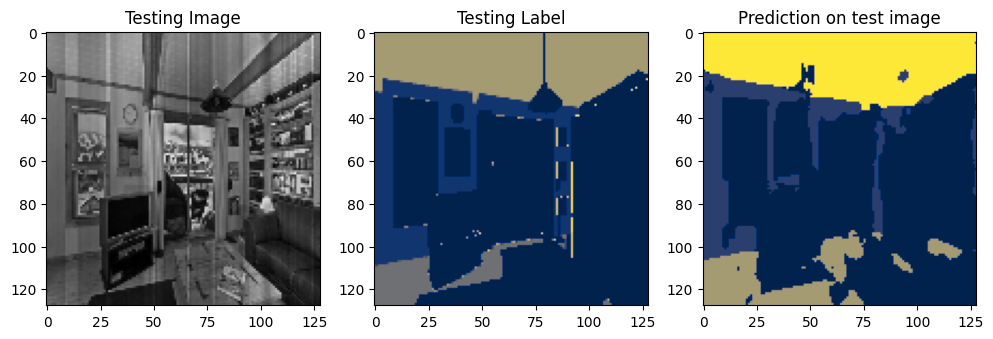

1/1 [==============================] - 0s 21ms/step


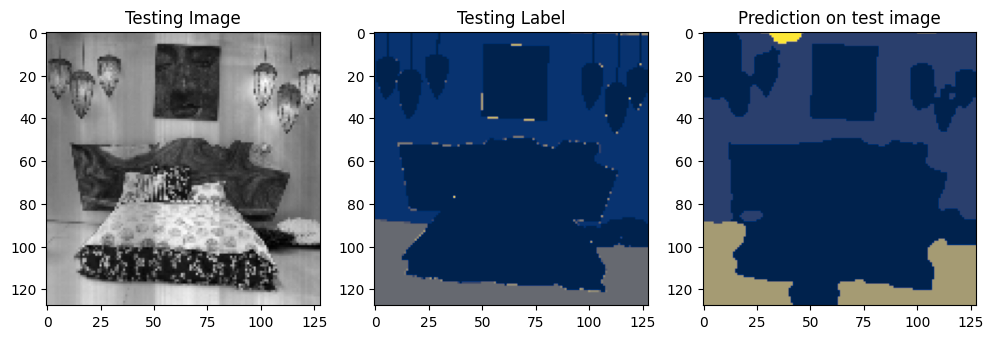

1/1 [==============================] - 0s 20ms/step


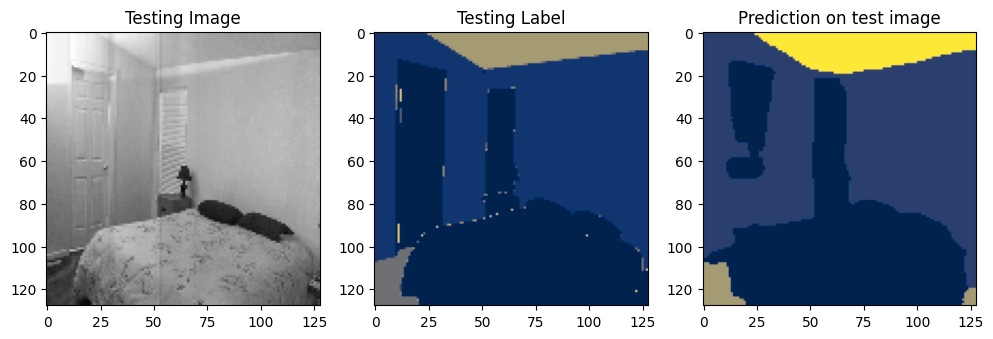

1/1 [==============================] - 0s 23ms/step


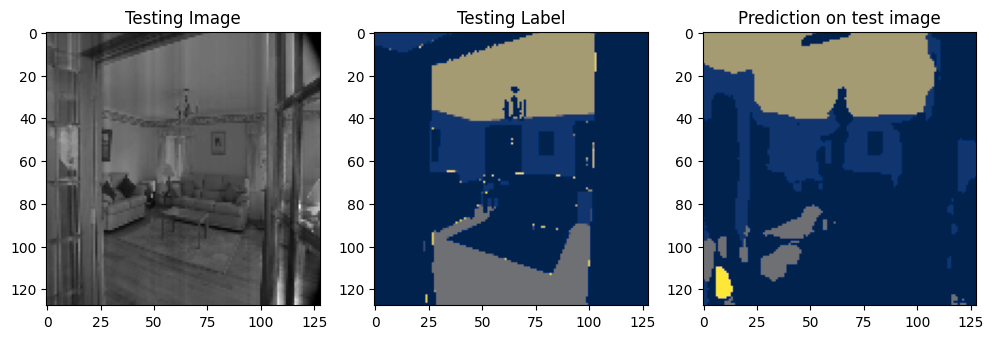

1/1 [==============================] - 0s 22ms/step


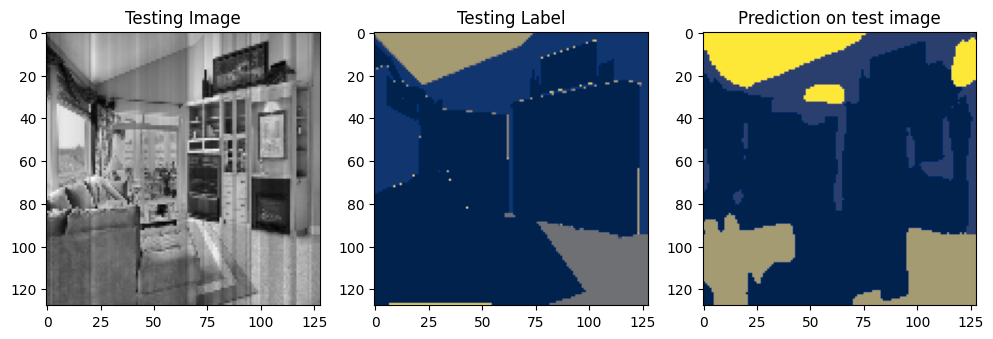

1/1 [==============================] - 0s 21ms/step


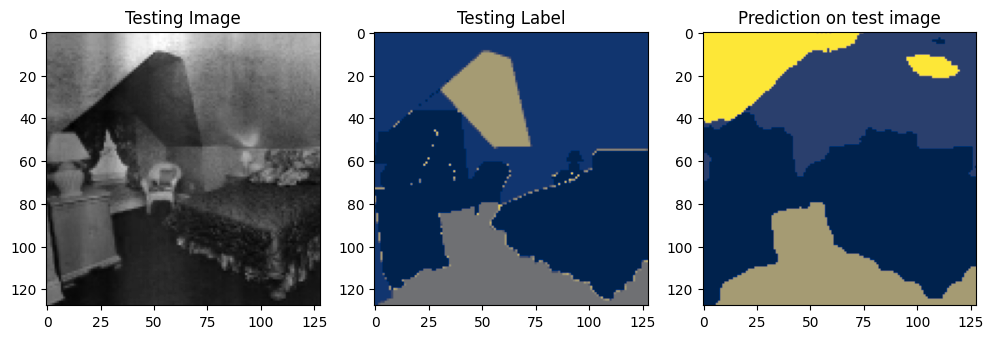

1/1 [==============================] - 0s 22ms/step


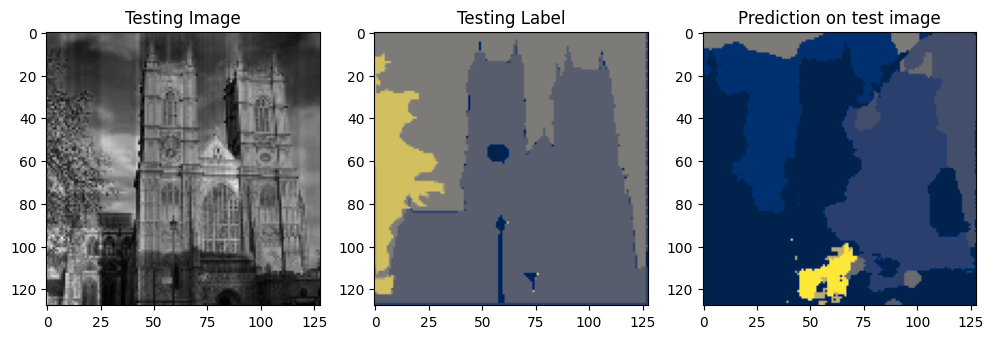

1/1 [==============================] - 0s 25ms/step


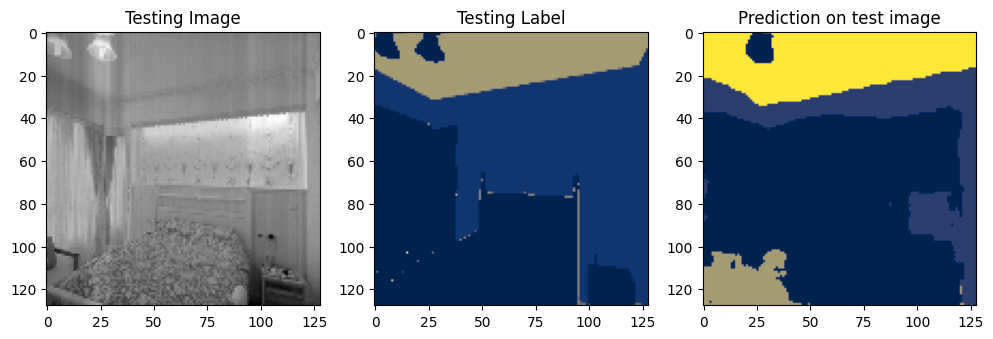

1/1 [==============================] - 0s 21ms/step


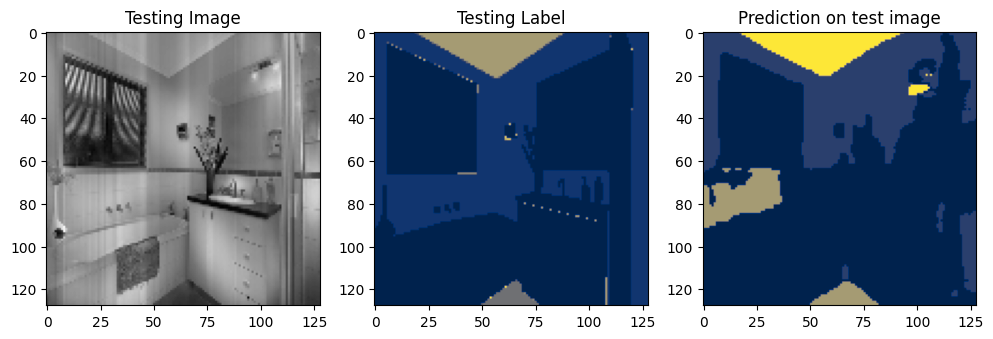

1/1 [==============================] - 0s 22ms/step


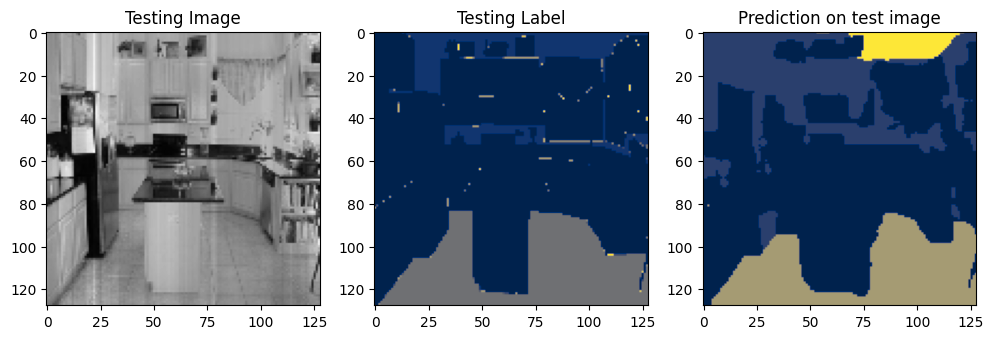

1/1 [==============================] - 0s 21ms/step


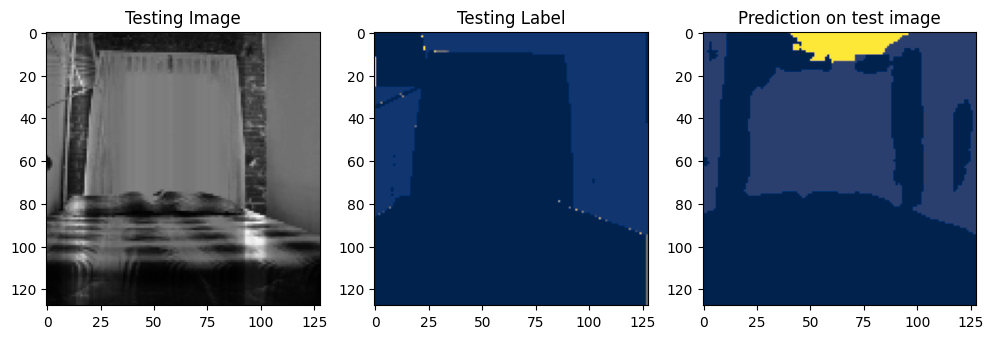

1/1 [==============================] - 0s 24ms/step


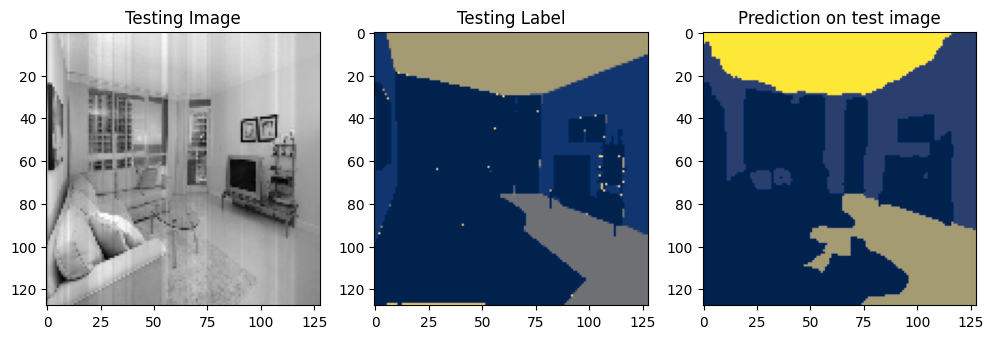

1/1 [==============================] - 0s 22ms/step


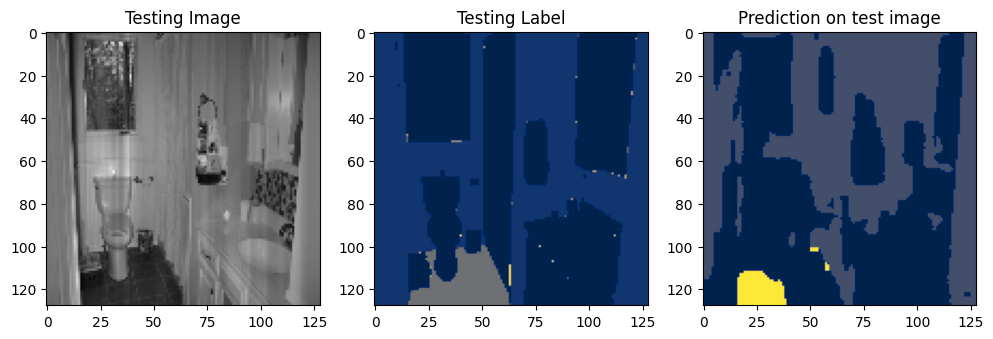

1/1 [==============================] - 0s 20ms/step


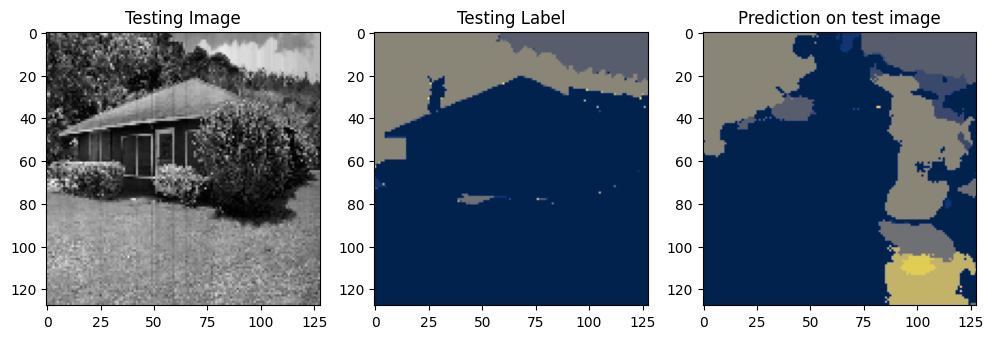

1/1 [==============================] - 0s 21ms/step


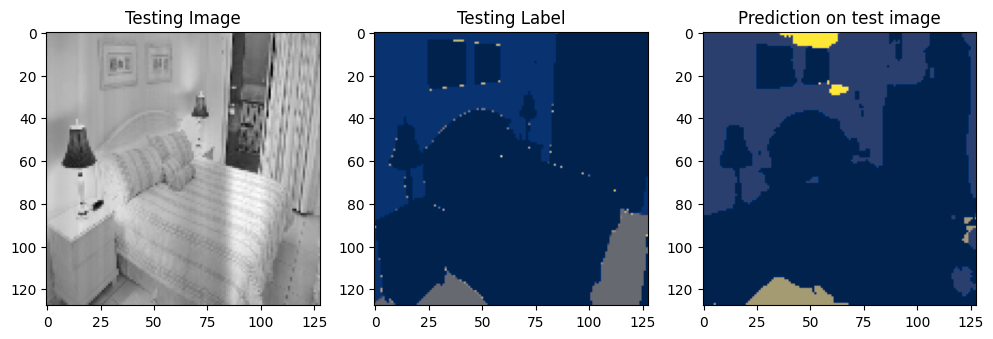

1/1 [==============================] - 0s 20ms/step


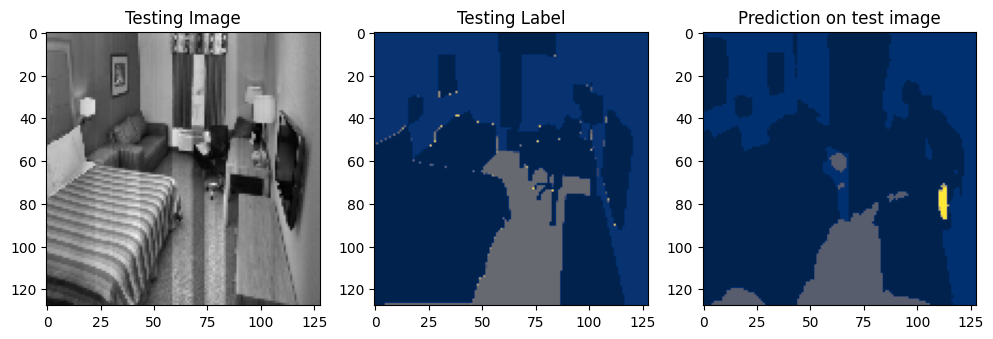

1/1 [==============================] - 0s 22ms/step


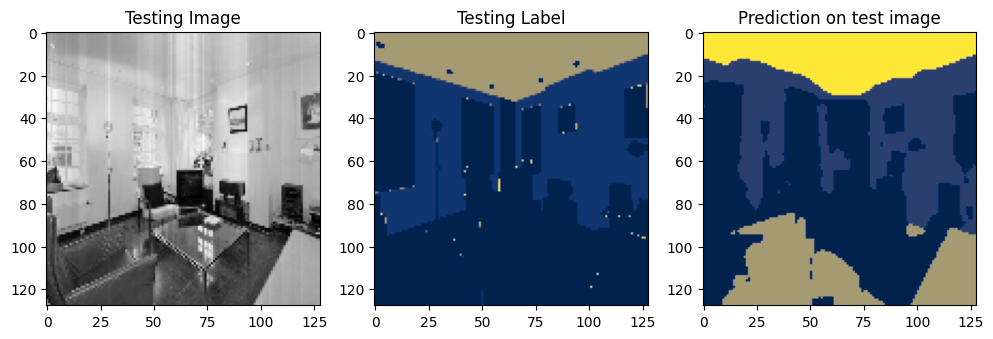

1/1 [==============================] - 0s 20ms/step


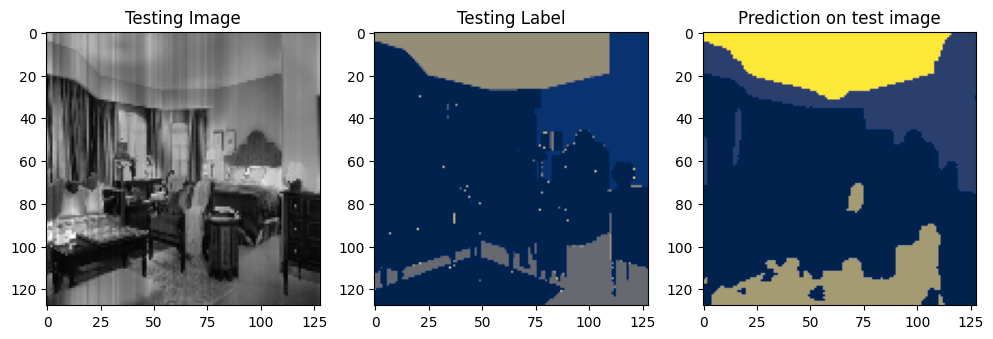

1/1 [==============================] - 0s 20ms/step


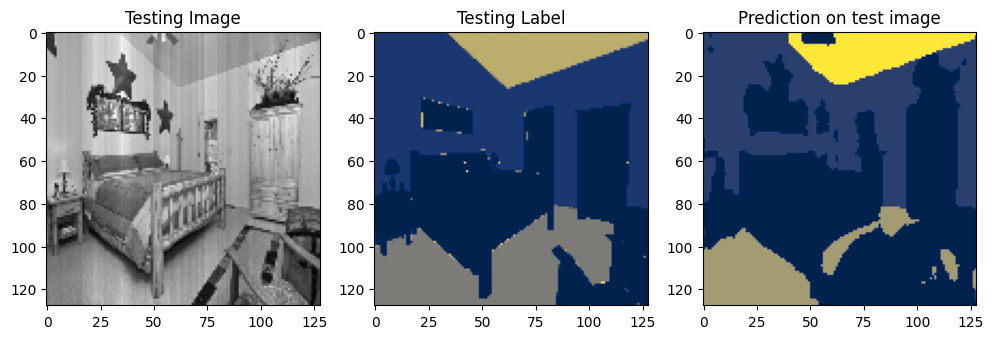

1/1 [==============================] - 0s 20ms/step


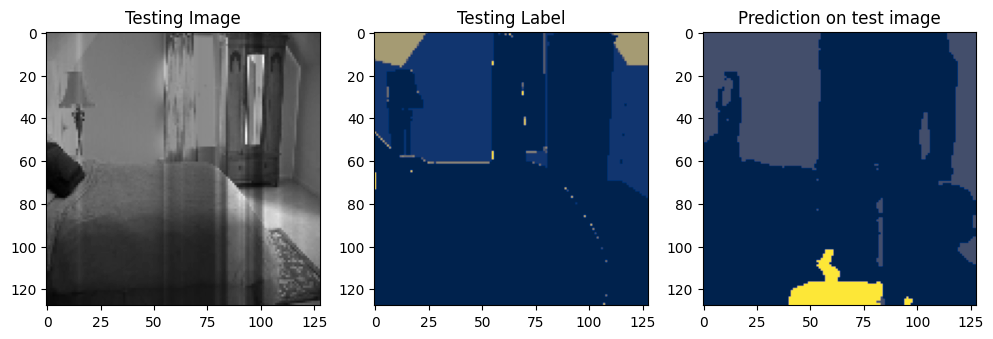

1/1 [==============================] - 0s 20ms/step


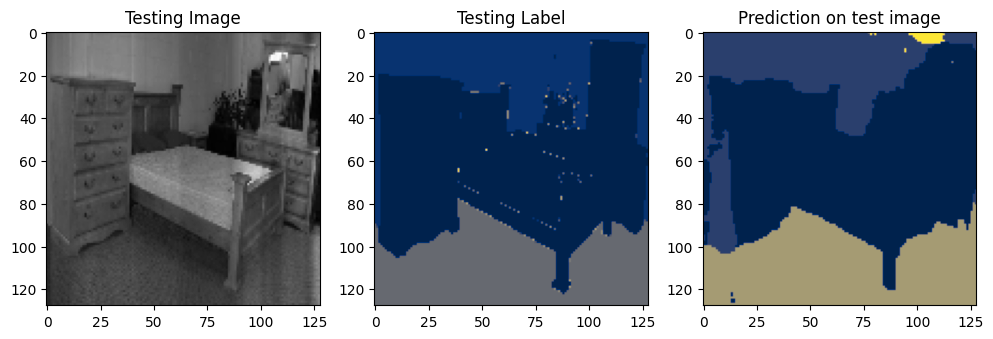

1/1 [==============================] - 0s 20ms/step


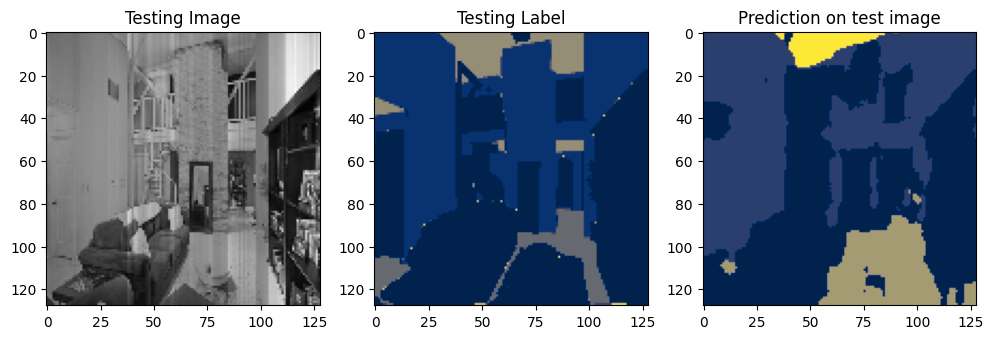

1/1 [==============================] - 0s 20ms/step


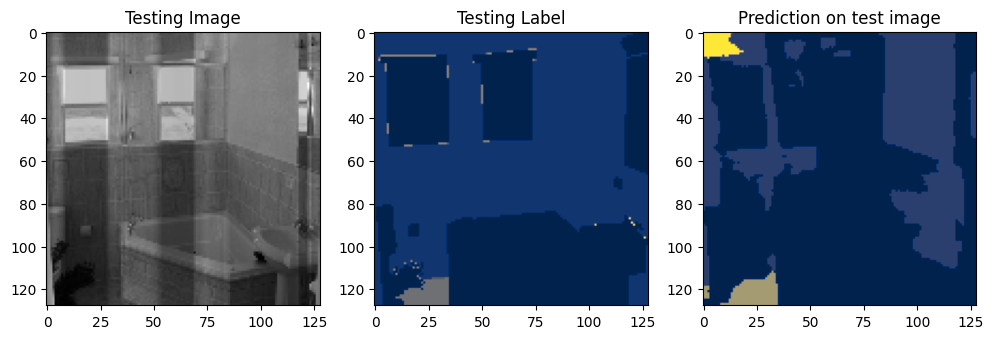

1/1 [==============================] - 0s 20ms/step


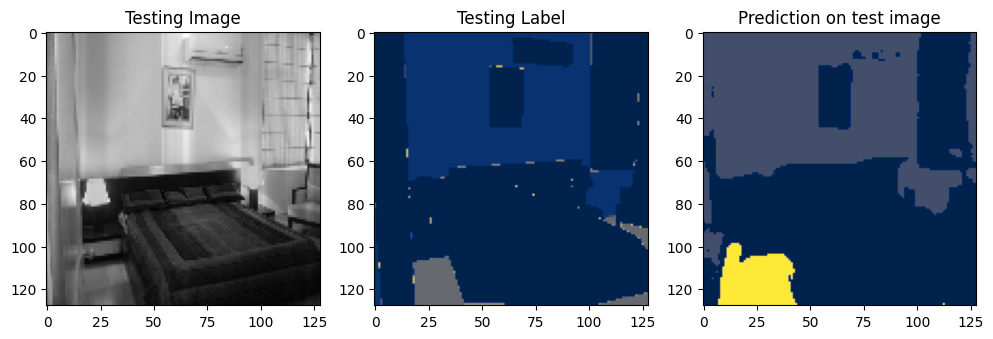

1/1 [==============================] - 0s 21ms/step


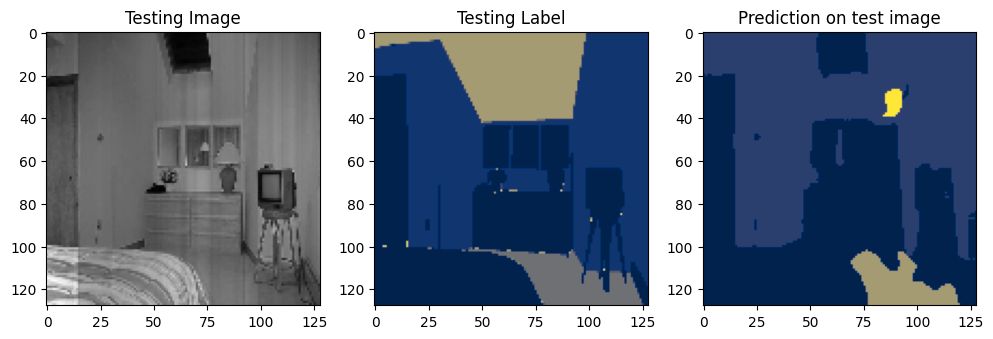

1/1 [==============================] - 0s 20ms/step


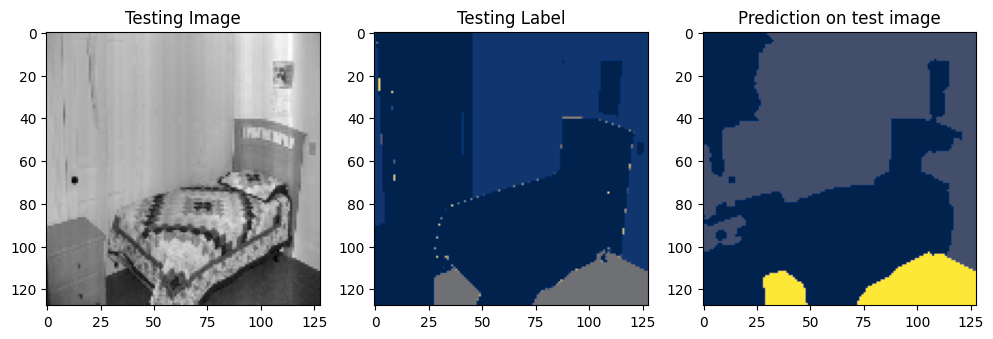

1/1 [==============================] - 0s 23ms/step


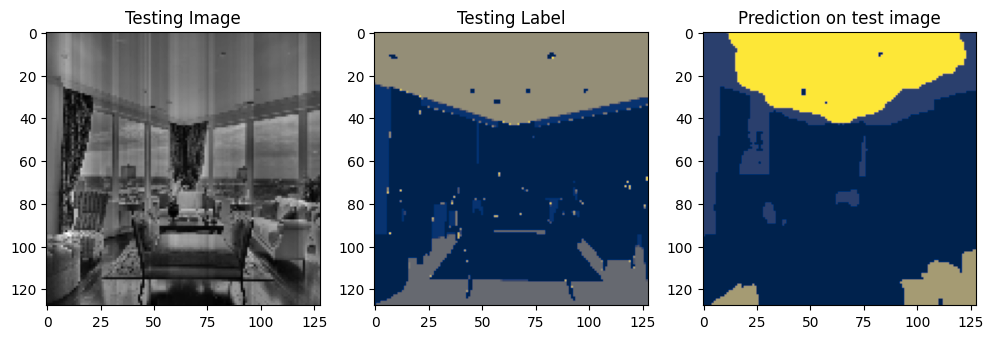

1/1 [==============================] - 0s 23ms/step


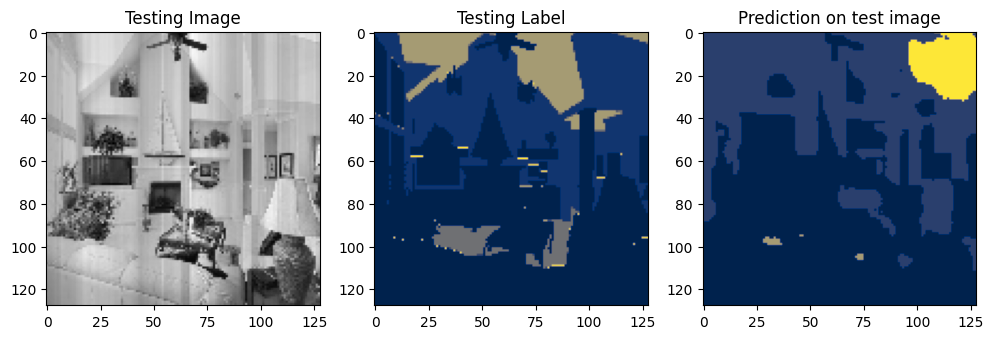

1/1 [==============================] - 0s 22ms/step


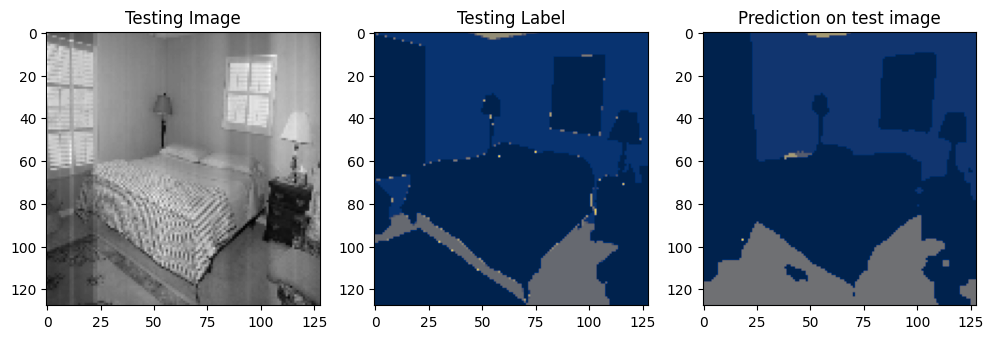

1/1 [==============================] - 0s 21ms/step


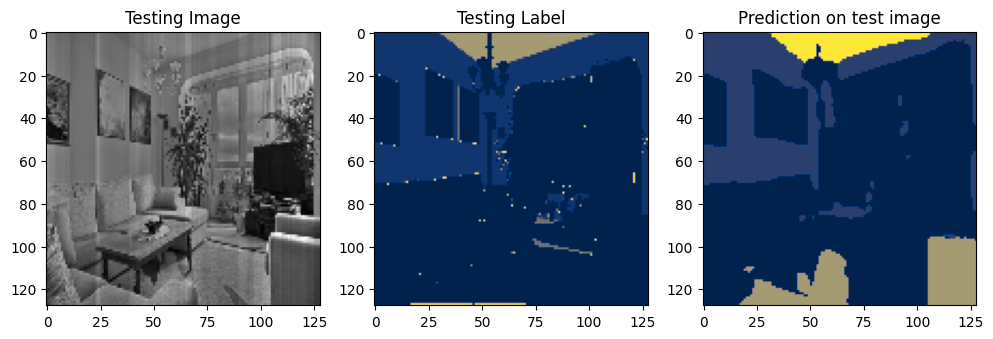

1/1 [==============================] - 0s 21ms/step


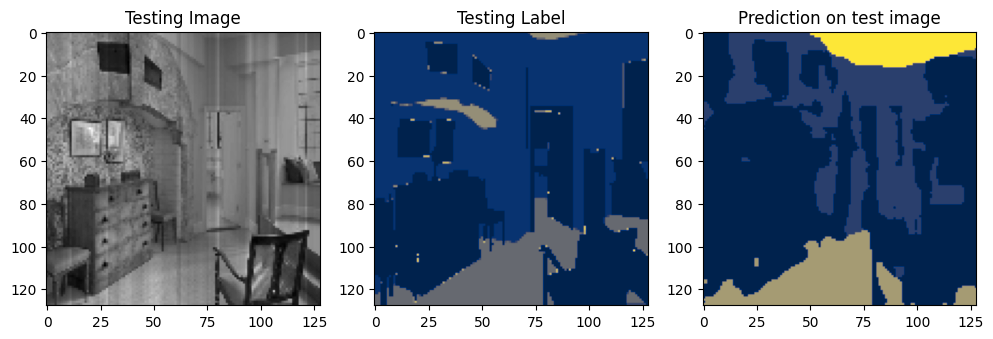

1/1 [==============================] - 0s 21ms/step


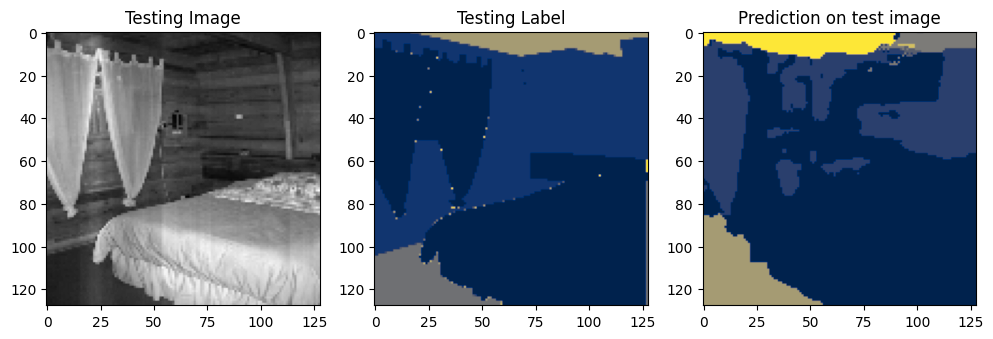

1/1 [==============================] - 0s 21ms/step


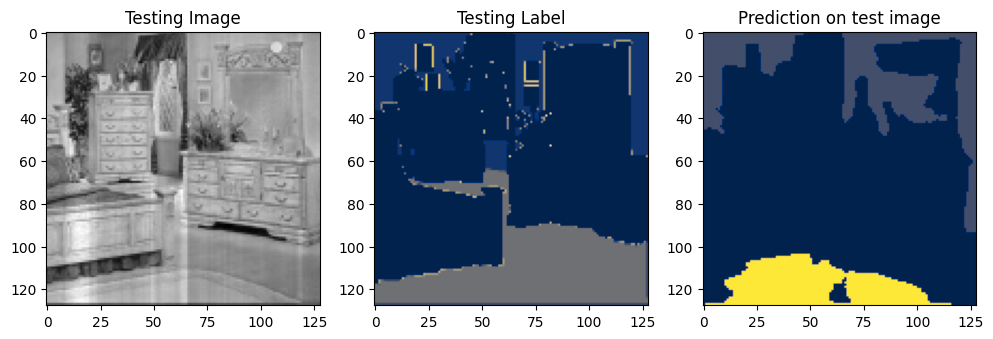

1/1 [==============================] - 0s 20ms/step


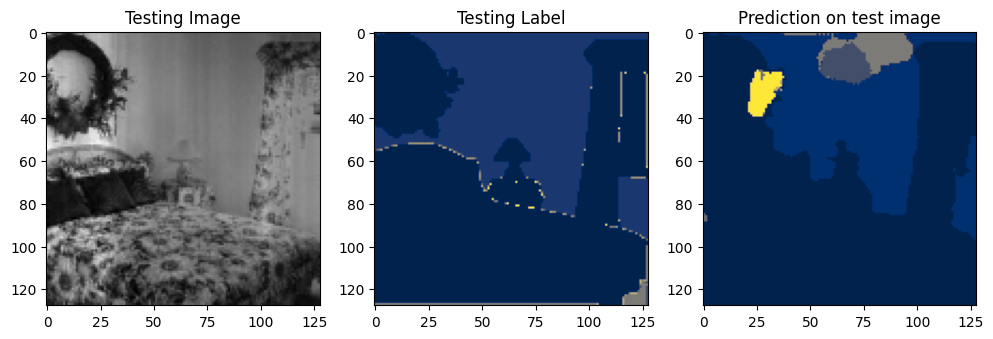

1/1 [==============================] - 0s 20ms/step


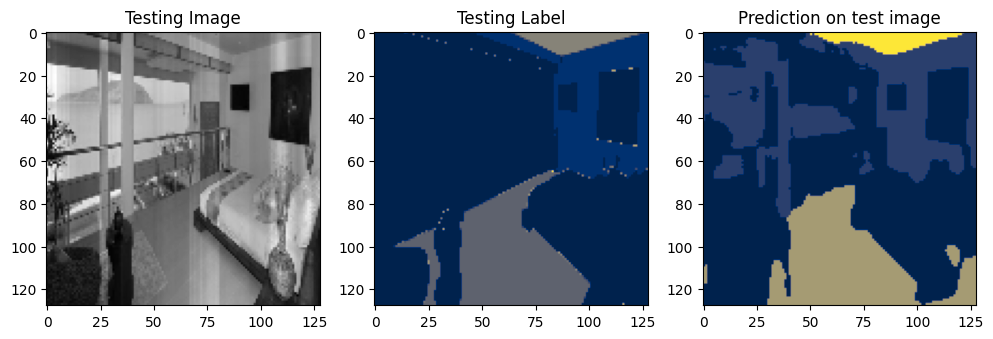

In [232]:

for test_img_number in range(X_test.shape[0]):
  test_img = X_test[test_img_number]
  ground_truth=y_test[test_img_number]
  test_img_norm=test_img[:,:,0][:,:,None]
  test_img_input=np.expand_dims(test_img_norm, 0)
  prediction = (model.predict(test_img_input))
  predicted_img=np.argmax(prediction, axis=3)[0,:,:]

  plt.figure(figsize=(12, 8))

  plt.subplot(231)
  plt.title('Testing Image')
  plt.imshow(test_img[:,:,0], cmap='gray')
  plt.subplot(232)
  plt.title('Testing Label')
  plt.imshow(ground_truth[:,:,0], cmap='cividis')
  plt.subplot(233)
  plt.title('Prediction on test image')
  plt.imshow(predicted_img, cmap='cividis')
  plt.show()




In [235]:
#Predict on a few images
#model = get_model()
#model.load_weights('???.hdf5')
import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]




1/1 [==============================] - 0s 20ms/step


[0 1 4]


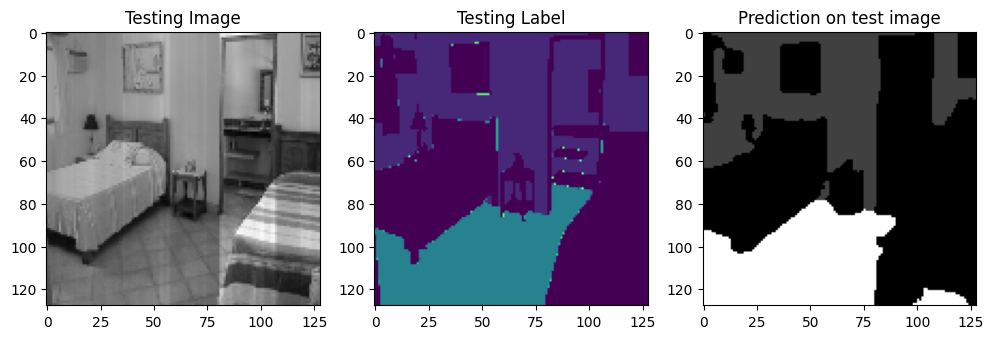

In [236]:
print(np.unique(predicted_img))
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], )
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(predicted_img, cmap='gray')
plt.show()


In [245]:
#Predict on a few images
#model = get_model()
#model.load_weights('???.hdf5')
import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]




1/1 [==============================] - 0s 20ms/step


In [246]:
np.unique(predicted_img)

array([ 0,  1,  4,  9, 12])

In [247]:
np.unique(ground_truth)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

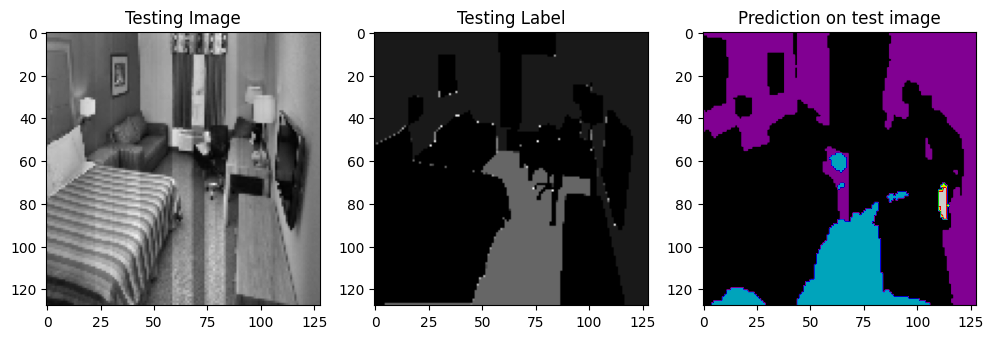

In [248]:
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], cmap='gray')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(predicted_img, cmap='nipy_spectral')
plt.show()


In [251]:
#Predict on a few images
#model = get_model()
#model.load_weights('???.hdf5')
import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]



1/1 [==============================] - 0s 19ms/step


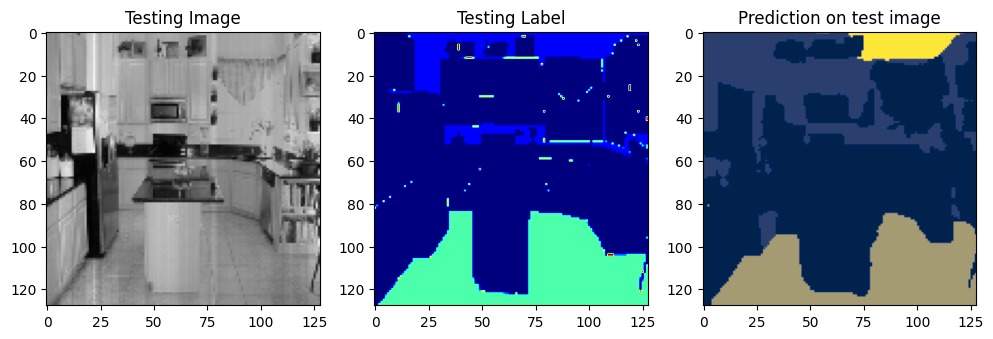

In [252]:
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], cmap='jet')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(predicted_img, cmap='cividis')
plt.show()


In [ ]:
pwd

In [ ]:
cd /content/drive/MyDrive

In [ ]:
!git clone https://github.com/SnehalB06/Scene-Parsing.git

In [ ]:
cd /content/drive/MyDrive/Scene-Parsing

In [ ]:
cp /content/weights-improvement-45-0.35.hdf5  /content/drive/MyDrive/Scene-Parsing/model

In [ ]:
#Predict on large image

#Apply a trained model on large image

from patchify import patchify, unpatchify

large_image = cv2.imread('large_images/large_image.tif', 0)
#This will split the image into small images of shape [3,3]
patches = patchify(large_image, (128, 128), step=128)  #Step=256 for 256 patches means no overlap

predicted_patches = []
for i in range(patches.shape[0]):
    for j in range(patches.shape[1]):
        print(i,j)

        single_patch = patches[i,j,:,:]
        single_patch_norm = np.expand_dims(normalize(np.array(single_patch), axis=1),2)
        single_patch_input=np.expand_dims(single_patch_norm, 0)
        single_patch_prediction = (model.predict(single_patch_input))
        single_patch_predicted_img=np.argmax(single_patch_prediction, axis=3)[0,:,:]

        predicted_patches.append(single_patch_predicted_img)

predicted_patches = np.array(predicted_patches)

predicted_patches_reshaped = np.reshape(predicted_patches, (patches.shape[0], patches.shape[1], 128,128) )

reconstructed_image = unpatchify(predicted_patches_reshaped, large_image.shape)
plt.imshow(reconstructed_image, cmap='gray')
#plt.imsave('data/results/segm.jpg', reconstructed_image, cmap='gray')

plt.hist(reconstructed_image.flatten())  #Threshold everything above 0

# final_prediction = (reconstructed_image > 0.01).astype(np.uint8)
# plt.imshow(final_prediction)

plt.figure(figsize=(8, 8))
plt.subplot(221)
plt.title('Large Image')
plt.imshow(large_image, cmap='gray')
plt.subplot(222)
plt.title('Prediction of large Image')
plt.imshow(reconstructed_image, cmap='jet')
plt.show()